# Predictive delays in commercial flights
## Phase 4

**Section 2, Team 2**: Camille Church, Anoop Nair, Dylan Jin, Ken Trinh, Shalini Chawla, Hector Rincon

### Updated credit assignment

**Phase leader**: Anoop Nair

In [ ]:
# import requests
# from IPython.display import display, Image

# #![Updated credit assignment on Monday.com](http://13.66.213.192/w261/phasePlan.png)
# # URL of the image
# image_url = "http://13.66.213.192/w261/phasePlan.png"

# # Use requests to get the image
# response = requests.get(image_url)

# # Check if the request was successful (status code 200)
# if response.status_code == 200:
#     # Display the image in the notebook
#     img = Image(response.content)
#     display(img)
# else:
#      print(f"Image is not accessible. Status code: {response.status_code}")

In [ ]:
%run "../configurations/mounting"

In [ ]:
# list all available joined flights data on ADLS 
# display(dbutils.fs.ls(f'{team_blob_url}/OTPW_Flights/'))

In [ ]:
#Install the holidays library if not already installed
!pip install holidays hyperopt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 9.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 200.5/200.5 kB 13.6 MB/s eta 0:00:00

[notice] A new release of pip available: 22.2.2 -> 23.2.1
[notice] To update, run: pip install --upgrade pip


In [ ]:
import pyspark.sql.types as T
import pyspark.sql.functions as F
from pyspark.sql import Window

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import holidays
from datetime import datetime, timedelta, date

sns.set()

In [ ]:
# Load Packages for Modeling

from pyspark.ml.feature import VectorAssembler, StandardScaler, StringIndexer, OneHotEncoder, PCA
from pyspark.ml.stat import Correlation
from pyspark.ml.classification import LogisticRegression
from pyspark.ml.classification import DecisionTreeClassifier
from pyspark.ml.classification import RandomForestClassifier
from pyspark.ml.classification import GBTClassifier
from pyspark.ml.classification import MultilayerPerceptronClassifier
from pyspark.ml import Pipeline

from pyspark.ml.evaluation import MulticlassClassificationEvaluator
from pyspark.ml.evaluation import BinaryClassificationEvaluator

import mlflow
import mlflow.spark

# run grisearch (set this to fasle after you get the param)
from pyspark.ml.tuning import CrossValidator, ParamGridBuilder
import itertools

from functools import reduce
from pyspark.sql import DataFrame

# set flags
random_split = True
run_corr_matrix = False
run_PCA_analysis = False
perform_resampling = False
apply_smote = False
resample_by_year = False
write_to_blob = True
grisearch = False
ts_grisearch = False

## Load Data

In [ ]:
# dataset name
dataset_name = "OTPW_3M" #"OTPW_3M"

In [ ]:
# ingest flights dataset
df_flights = spark.read.format('parquet')\
                        .option("inferSchema", True)\
                        .load(f"{team_blob_url}/OTPW_Flights/{dataset_name}").cache()

In [ ]:
# Group data by year and count records for each year
year_counts = df_flights.groupBy('YEAR').count()

# Show the count of records for each year
year_counts.show()

+----+-------+
|YEAR|  count|
+----+-------+
|2015|1401363|
+----+-------+



# Project Abstract

This week, our goal was to build upon our baseline models from the previous week while improving the predictive accuracy of our models. We used the 60M dataset performing additional feature engineering including RFM analysis based on the time factors and graph analysis driven by the connected nature of the flight network. 

In addition to our baseline models of Logistic Regression and Decision Tree, we also explored ensemble models of Random Forest and Gradient Boosted Trees for delay prediction. We Used GridSearch for hyperparameter tuning of our base models and Cross Validation for model evaluation. Using the additional features, we were able to bring our test AUC up to .69 (from .57) for the three months data set and 0.65 for the full 60 months data set. We also incorporated MLFlow in our notebook to log and track our model training runs and evaluation metrics.

For this iteration, we utilized spark's build in crossvalidation to perform gridsearch on the logistic regression model. We ran into issues with using time series GridSearch across models due to excessive runtimes as well as subpar results compared to using default parameters. On logistic regression along, the total measured time was over eight hours. We need to further explore our options for hyperparameter tuning in the upcoming weeks.

# Project Description

Our source dataset is the 60 Month flights delay dataset that contains flights and weather information for 5 years from 2015 through 2019.

The goal of the project is to predict the DEP_DEL15 column, which is a departure delay indicator, 15 Minutes or More (1=Yes the flight is delayed by at least 15 minutes)  

The project consists of the below phases:

- Data Cleaning: Dropped columns with >25% values and samples with missing essential information

- Feature Selection: Selected flight and weather related features based on EDA and correlation analysis

- Feature Engineering:  (Additional features)
     - Holiday Rush indicator by joining US Holidays information with the core dataset
     - Departure timeslot by grouping the flight departure time into Morning/Evening/Afternoon/Night
     - Sesonal Information by grouping deprature months into Seasons
     - Weather reading latecy flag by measuring the time lag between scheduled departure time and time of weather report
     - Recency/Frequency/Monetary using RFM Analysis
     - Airport Rank using Graph Analysis
     
- Feature Transformation:
    - PCA for dimentionality Reduction
    - Standard scaling of all numerical features
    - Binning of airport codes by flight volume into 4 buckets 
    - One hot encoding of categorical features

 - Train/Test split: Split the data to use data from 2015-2018 for Train/validation and 2019 data for test

 - Model Training: Trained 4 different model categories Logistic Regression, Decision Tree, Random Forest and Gradient Boosted Tree

 - Hyperparameter Tuning: Used grid search for hyperparameter tuning using cross validation on data split by time blocks

In [ ]:
# import requests
# from IPython.display import display, Image

# # URL of the image
# image_url = "http://13.66.213.192/w261/flow_diagram.png"

# # Use requests to get the image
# response = requests.get(image_url)

# # Check if the request was successful (status code 200)
# if response.status_code == 200:
#     # Display the image in the notebook
#     img = Image(response.content)
#     display(img)
# else:
#     print(f"Image is not accessible. Status code: {response.status_code}")


In [ ]:
# how many delays per total set
print(f"Number of Flights Delayed in 3M: {df_flights.filter('DEP_DEL15 = 1').count()}")
print(f"Total Number of Flights in 3M: {df_flights.count()}")
print(f"Percentage of Flights Delayed in 3M: {round(df_flights.filter('DEP_DEL15 = 1').count()/df_flights.count()*100,2)}%")

majority_class_proba = 1-round(df_flights.filter('DEP_DEL15 = 1').count()/df_flights.count())

Number of Flights Delayed in 3M: 277302
Total Number of Flights in 3M: 1401363
Percentage of Flights Delayed in 3M: 19.79%


# Feature Engineering

## Apply Holidays Flag

In [ ]:
#Create a list of years from 2015 to the current year
current_year = date.today().year
years = list(range(2015, current_year + 1))

#Initialize the UnitedStates class from the holidays library
us_holidays = holidays.UnitedStates(years=years)

# Extract the list of holiday dates as strings in 'yyyy-mm-dd' format
holiday_dates = [str(holiday_date) for holiday_date in us_holidays.keys()]

def is_holiday(date_str):
    return 1 if date_str in holiday_dates else 0

# Register the UDF with Spark
is_holiday_udf = F.udf(is_holiday, T.IntegerType())

# Add new holiday column to dataframe
df_flights = df_flights.withColumn('IS_HOLIDAY', is_holiday_udf(F.date_format('FL_DATE', 'yyyy-MM-dd')))

We now add a `HOLIDAY_RUSH` indicator column to a window of 2 days on either side of identified holidays, plus the actual holiday date

In [ ]:
# Add the 'HOLIDAY_RUSH' column to the DataFrame
df_flights = df_flights.withColumn('HOLIDAY_RUSH', F.when(
    (is_holiday_udf(F.date_format(F.date_sub(df_flights['FL_DATE'], 1), 'yyyy-MM-dd')) == 1) |
    (is_holiday_udf(F.date_format(F.date_sub(df_flights['FL_DATE'], 2), 'yyyy-MM-dd')) == 1) |
    (is_holiday_udf(F.date_format(F.date_add(df_flights['FL_DATE'], 1), 'yyyy-MM-dd')) == 1) |
    (is_holiday_udf(F.date_format(F.date_add(df_flights['FL_DATE'], 2), 'yyyy-MM-dd')) == 1) |
    (is_holiday_udf(F.date_format(df_flights['FL_DATE'], 'yyyy-MM-dd')) == 1),
    1
).otherwise(0))

## Apply Departure Timeslot Flag

In [ ]:
## Most number of flights are during 6am - 7am timeslot
## Most delay is during 5pm - 6pm timeslot
## As day progresses, delay increases

## We can create another timeslot variable with DEP_TIME_BLK grouped as below:
## morning : 0600-0659, 0700-0759, 0800-0859, 0900-0959
## mid-morning: 0900-0959, 1000-1059, 1100-1159
## afternoon : 1200-1259, 1300-1359, 1400-1459
## evening : 1500-1559, 1600-1659, 1700-1759, 1800-1859
## night: 1900-1959, 2000-2059, 2100-2159, 2200-2259, 2300-2359, 0001-0559,

# Define a UDF to map 'DEPT_TIME_BLK' to 'TIME_SLOT'
def map_time_slot(dept_time_blk):
    if dept_time_blk in ['0600-0659', '0700-0759', '0800-0859', '0900-0959']:
        return 'morning'
    elif dept_time_blk in ['1000-1059', '1100-1159']:
        return 'mid-morning'
    elif dept_time_blk in ['1200-1259', '1300-1359', '1400-1459']:
        return 'afternoon'
    elif dept_time_blk in ['1500-1559', '1600-1659', '1700-1759', '1800-1859']:
        return 'evening'
    elif dept_time_blk in ['1900-1959', '2000-2059', '2100-2159', '2200-2259', '2300-2359', '0001-0559']:
        return 'night'
    else:
        return 'unknown'

# Convert the UDF to a Spark UDF
map_time_slot_udf = F.udf(map_time_slot)

# Add the new 'TIME_SLOT' column based on 'DEPT_TIME_BLK'
df_flights = df_flights.withColumn('TIME_SLOT', map_time_slot_udf('DEP_TIME_BLK'))


## Apply Seasonal Flag

In [ ]:
# Define a UDF to map the month to the corresponding season
def get_season(month):
    if month in [12, 1, 2]:
        return 'winter'
    elif month in [3, 4, 5]:
        return 'spring'
    elif month in [6, 7, 8]:
        return 'summer'
    elif month in [9, 10, 11]:
        return 'fall'
    else:
        return 'unknown'

# Register the UDF with Spark
get_season_udf = F.udf(get_season, F.StringType())

# Add the 'season' column to the DataFrame
df_flights = df_flights.withColumn('SEASON', get_season_udf(F.col('MONTH')))

## Apply Weather Measurement Flag

Weather taken closer to depart would affect the delay. Here we're taking the differences between weather datetime column 'DATE' and the three scheduled depart columns.

In [ ]:
# determine when weather condition was measured
df_flights = df_flights.withColumn('delta_depart_2h', 
                                    F.abs(F.col('DATE').cast(T.TimestampType())-F.col('two_hours_prior_depart_UTC').cast(T.TimestampType())))\
                            .withColumn('delta_depart_4h', 
                                    F.abs(F.col('DATE').cast(T.TimestampType())-F.col('four_hours_prior_depart_UTC').cast(T.TimestampType())))\
                            .withColumn('delta_depart', 
                                    F.abs(F.col('DATE').cast(T.TimestampType())-F.col('sched_depart_date_time_UTC').cast(T.TimestampType())))\
                            .withColumn('weather_condition_measured_time_from_depart', 
                                    F.least(F.col('delta_depart_2h'), F.col('delta_depart_4h'), F.col('delta_depart')))\
                            .withColumn('closest_depart_time_weather_measurement', 
                                    F.when(F.col('weather_condition_measured_time_from_depart') == F.col('delta_depart_2h'), '2hr_from_depart')\
                                    .when(F.col('weather_condition_measured_time_from_depart') == F.col('delta_depart_4h'), '4hr_from_depart')\
                                    .otherwise('on_depart'))\
                            .withColumn("weather_condition_measured_time_from_depart", 
                                    F.col('weather_condition_measured_time_from_depart').cast(T.IntegerType())).cache()

<Figure size 640x480 with 0 Axes>

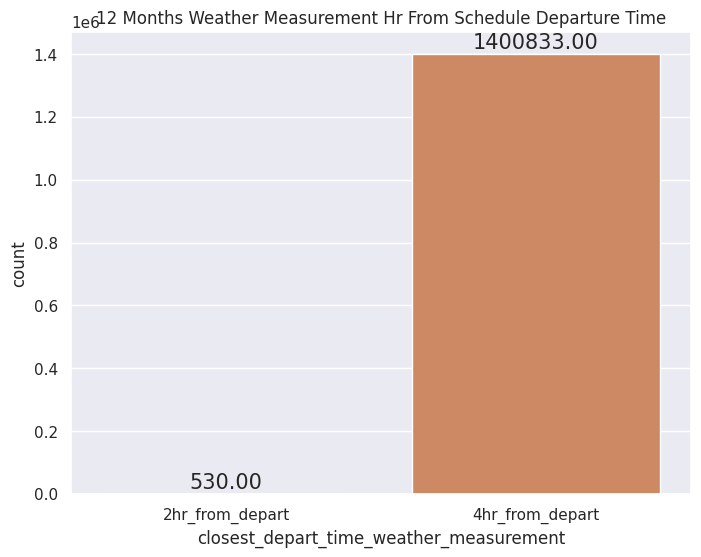

In [ ]:
# Plot to show the count of when weather conditionw was taken
# aggregate the data on the when the weather measuremt is
weather_measurement_df = df_flights.groupby("closest_depart_time_weather_measurement").count().toPandas()

plt.clf()
plt.figure(figsize=(8,6))
plots = sns.barplot(x = weather_measurement_df['closest_depart_time_weather_measurement'], y = weather_measurement_df['count'])

# Iterating over the bars one-by-one
# label the bar with the count of each bar
for bar in plots.patches:
    plots.annotate(format(bar.get_height(), ".2f"),
                   (bar.get_x() + bar.get_width() / 2,
                    bar.get_height()), ha='center', va='center',
                    size=15, xytext=(0, 8),
                    textcoords='offset points')

plt.title(f"12 Months Weather Measurement Hr From Schedule Departure Time")
plt.show()

## RFM (Recency, Frequency, Monetary) Analysis
Similar to the usage of RFM analysis to identify the best and most at risk customers of a business, we analyze the flight delay data to calculate recency, Frequency, Monetary value that contribute to the probablity of a flight being delayed. For flights(Carrier+FL Number), we calculate...

- **Recency**: When was the last time this flight got delayed.  
  - More recent delay -> Higher probability of future delays
- **Frequency**: How frequently is a flight delayed. We calculate this using the no of delayed flights/the total number of flights.  
  - Higher ratio of delays -> Higher probability of future delays
- **Monetary**: The average delay time for the flight. We calculate this only for the delayed flights as Total delay time/number of flight.  
  - Higher average delay -> Higher probability of future delays

In [ ]:
#Fields required for the RFM Analysis
display(df_flights.filter("DEP_DEL15 == '1'")
                     .select(F.col('OP_UNIQUE_CARRIER'), 
                             F.col('OP_CARRIER_FL_NUM'), 
                             F.col('FL_DATE'), 
                             F.col('DEP_DELAY'), 
                             F.col('DEP_DEL15')))

OP_UNIQUE_CARRIER,OP_CARRIER_FL_NUM,FL_DATE,DEP_DELAY,DEP_DEL15
AA,41,2015-02-02,15.0,1.0
AA,49,2015-01-11,63.0,1.0
AA,131,2015-02-02,42.0,1.0
AA,132,2015-02-25,42.0,1.0
AA,150,2015-02-27,195.0,1.0
AA,154,2015-01-09,33.0,1.0
AA,154,2015-03-15,29.0,1.0
AA,154,2015-03-23,112.0,1.0
AA,181,2015-02-10,114.0,1.0
AA,200,2015-01-02,96.0,1.0


In [ ]:
#Use the maximum flight date as the reference for calculating recency
max_flight_date = df_flights.select(F.max('FL_DATE')).collect()[0]['max(FL_DATE)'].strftime("%Y-%m-%d")


In [ ]:

df_flights = df_flights.withColumn("RecencyDays", F.expr(f"datediff('{max_flight_date}', DATE)"))
display(df_flights.filter("DEP_DEL15 == '1'")
                     .select(F.col('OP_UNIQUE_CARRIER'),
                             F.col('OP_CARRIER_FL_NUM'), 
                             F.col('FL_DATE'), 
                             F.col('DEP_DELAY'), 
                             F.col('DEP_DEL15'), 
                             F.col('RecencyDays')))

OP_UNIQUE_CARRIER,OP_CARRIER_FL_NUM,FL_DATE,DEP_DELAY,DEP_DEL15,RecencyDays
AA,41,2015-02-02,15.0,1.0,57
AA,49,2015-01-11,63.0,1.0,79
AA,131,2015-02-02,42.0,1.0,57
AA,132,2015-02-25,42.0,1.0,34
AA,150,2015-02-27,195.0,1.0,32
AA,154,2015-01-09,33.0,1.0,81
AA,154,2015-03-15,29.0,1.0,16
AA,154,2015-03-23,112.0,1.0,8
AA,181,2015-02-10,114.0,1.0,49
AA,200,2015-01-02,96.0,1.0,88


In [ ]:
#RFM Calculations version 2
#Recenecy is only recent occurance of delayed flight
#Frequency should be calculated relative to total no of flights, not just occurances of delay
#Monetary should be average delay not just total delay since it will be senstive to the frequency of flight
rfm_table = df_flights.filter("DEP_DEL15 == '1'") \
                        .groupBy("OP_UNIQUE_CARRIER", "OP_CARRIER_FL_NUM") \
                        .agg(F.min("RecencyDays").alias("Recency"), \
                              F.avg("DEP_DELAY").alias("Monetary"))
                        
frequency_table = df_flights.groupBy("OP_UNIQUE_CARRIER", "OP_CARRIER_FL_NUM") \
                        .agg(F.sum('DEP_DEL15').alias('no_delays'),
                            F.count('DEP_DEL15').alias('no_flights'))\
                            .withColumn('Frequency',F.col('no_delays')/F.col('no_flights'))

rfm_table = rfm_table.join(frequency_table, ["OP_UNIQUE_CARRIER", "OP_CARRIER_FL_NUM"]).drop("no_delays").drop("no_flights")

display(rfm_table)

OP_UNIQUE_CARRIER,OP_CARRIER_FL_NUM,Recency,Monetary,Frequency
AA,1086,0,63.68888888888889,0.2631578947368421
AS,335,1,72.0,0.1511627906976744
AS,671,15,69.0,0.18888888888888888
DL,1267,4,39.733333333333334,0.17857142857142858
DL,1902,4,57.04,0.30864197530864196
EV,2522,14,187.875,0.0975609756097561
F9,787,6,39.666666666666664,0.1111111111111111
HA,314,2,33.733333333333334,0.16853932584269662
MQ,2983,14,43.458333333333336,0.2891566265060241
MQ,3197,4,61.23076923076923,0.3291139240506329


In [ ]:
# binning the RFM tables into quantiles
r_quartile = rfm_table.approxQuantile("Recency", [0.25, 0.5, 0.75], 0)
f_quartile = rfm_table.approxQuantile("Frequency", [0.25, 0.5, 0.75], 0)
m_quartile = rfm_table.approxQuantile("Monetary", [0.25, 0.5, 0.75], 0)

rfm_table = rfm_table.withColumn("R_Quartile", \
                                 F.when(F.col("Recency") >= r_quartile[2] , 'A')\
                                 .when(F.col("Recency") >= r_quartile[1] , 'B')\
                                 .when(F.col("Recency") >= r_quartile[0] , 'C')\
                                 .otherwise('D'))

rfm_table = rfm_table.withColumn("F_Quartile", \
                                 F.when(F.col("Frequency") > f_quartile[2] , 'D')\
                                 .when(F.col("Frequency") > f_quartile[1] , 'C')\
                                 .when(F.col("Frequency") > f_quartile[0] , 'B')\
                                 .otherwise("A"))

rfm_table = rfm_table.withColumn("M_Quartile", \
                                 F.when(F.col("Monetary") >= m_quartile[2] , 'D')\
                                 .when(F.col("Monetary") >= m_quartile[1] , 'C')\
                                 .when(F.col("Monetary") >= m_quartile[0] , 'B')\
                                 .otherwise('A'))

In [ ]:
#flights wiht least probability dor delay based on RFM scores
display(rfm_table.orderBy("R_Quartile","F_Quartile", "M_Quartile"))

OP_UNIQUE_CARRIER,OP_CARRIER_FL_NUM,Recency,Monetary,Frequency,R_Quartile,F_Quartile,M_Quartile
WN,1932,44,32.0,0.11764705882352941,A,A,A
WN,1763,85,23.0,0.07142857142857142,A,A,A
WN,4453,34,37.77777777777778,0.06428571428571428,A,A,A
DL,1729,55,21.0,0.017241379310344827,A,A,A
OO,4571,38,22.333333333333332,0.06382978723404255,A,A,A
AA,1496,75,20.75,0.10810810810810811,A,A,A
WN,2847,45,18.333333333333332,0.075,A,A,A
AS,329,32,36.4,0.07692307692307693,A,A,A
HA,182,39,28.0,0.022222222222222223,A,A,A
WN,3569,45,22.5,0.046511627906976744,A,A,A


In [ ]:
#flights with higest probability for delay based on RFM scores
display(rfm_table.orderBy(F.col("R_Quartile").desc(), 
                          F.col("F_Quartile").desc(), 
                          F.col("M_Quartile").desc()))

OP_UNIQUE_CARRIER,OP_CARRIER_FL_NUM,Recency,Monetary,Frequency,R_Quartile,F_Quartile,M_Quartile
NK,689,0,86.34042553191489,0.5465116279069767,D,D,D
WN,1438,0,68.88888888888889,0.3829787234042553,D,D,D
OO,5535,1,89.04545454545455,0.30985915492957744,D,D,D
EV,4625,0,74.625,0.3076923076923077,D,D,D
VX,935,0,102.38709677419355,0.34831460674157305,D,D,D
EV,4308,1,70.07407407407408,0.35526315789473684,D,D,D
WN,2140,0,71.3076923076923,0.37142857142857144,D,D,D
MQ,2980,1,72.25,0.5490196078431373,D,D,D
UA,1481,1,80.17307692307692,0.42276422764227645,D,D,D
AA,256,1,70.61538461538461,0.30952380952380953,D,D,D


In [ ]:
df_flights.select("TAXI_OUT").summary().show()

+-------+------------------+
|summary|          TAXI_OUT|
+-------+------------------+
|  count|           1358244|
|   mean|16.396356619281956|
| stddev| 9.629625430553235|
|    min|               1.0|
|    25%|              11.0|
|    50%|              14.0|
|    75%|              19.0|
|    max|             225.0|
+-------+------------------+



## Airport Rank

In [ ]:
from graphframes import GraphFrame
import networkx as nx

# Create a new DataFrame containing unique airport codes
airport_codes_df = df_flights.select('origin_iata_code').union(df_flights.select('dest_iata_code')).distinct()

# Create vertices DataFrame
vertices = airport_codes_df.withColumnRenamed('origin_iata_code', 'id')

# Create edges DataFrame
edges = df_flights.select('origin_iata_code', 'dest_iata_code', 'Distance') \
                  .withColumnRenamed('origin_iata_code', 'src') \
                  .withColumnRenamed('dest_iata_code', 'dst')

# Create a GraphFrame
#g = GraphFrame(vertices, edges)

# Create Graph from the GraphFrame
nx_graph = nx.from_pandas_edgelist(edges.toPandas(), 'src', 'dst', edge_attr='Distance', create_using=nx.DiGraph())

# Calculate degree centrality
degree_centrality = nx.degree_centrality(nx_graph)

# Calculate betweenness centrality
betweenness_centrality = nx.betweenness_centrality(nx_graph)

# Calculate closeness centrality
closeness_centrality = nx.closeness_centrality(nx_graph)

# Convert the results to DataFrames and alias the columns
degree_centrality_df = spark.createDataFrame([(k, v) for k, v in degree_centrality.items()], ['origin_iata_code', 'degree_centrality'])
betweenness_centrality_df = spark.createDataFrame([(k, v) for k, v in betweenness_centrality.items()], ['origin_iata_code', 'betweenness_centrality'])
closeness_centrality_df = spark.createDataFrame([(k, v) for k, v in closeness_centrality.items()], ['origin_iata_code', 'closeness_centrality'])

# Merge the graph-based features with the original DataFrame
df_flights = df_flights.join(degree_centrality_df, on='origin_iata_code', how='left')
df_flights = df_flights.join(betweenness_centrality_df, on='origin_iata_code', how='left')
df_flights = df_flights.join(closeness_centrality_df, on='origin_iata_code', how='left')

In [ ]:
# Calculate the "airport rank" column based on the graph-based features
df_flights = df_flights.withColumn('airport_rank', 
                                   F.col('degree_centrality') +
                                   F.col('betweenness_centrality') +
                                   F.col('closeness_centrality'))

In [ ]:
# check nulls on added columns
# visualize the amount of Nulls for weather columns
graph_features_cols = ["degree_centrality", "betweenness_centrality", 
                        "closeness_centrality", "airport_rank"]

# get number of records
print(f"Total Number of Flights: {df_flights.count()}")
display(df_flights.select([F.count(F.when(F.isnan(c) | F.col(c).isNull(), c)).alias(c) for c in graph_features_cols]))

Total Number of Flights: 1401363


degree_centrality,betweenness_centrality,closeness_centrality,airport_rank
0,0,0,0


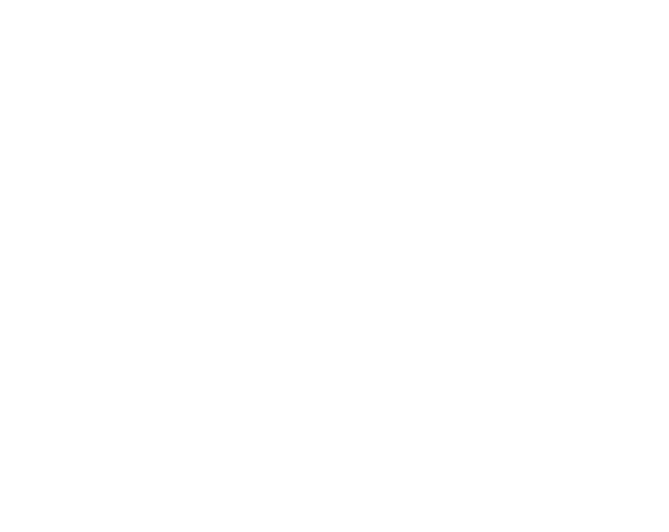

In [ ]:
# Select a subset of airports to visualize
subset_airports = df_flights.select('origin_iata_code').distinct().limit(10).toPandas()['origin_iata_code'].tolist()

subgraph = nx_graph.subgraph(subset_airports)

pos = nx.spring_layout(subgraph, seed=42)

nx.draw(subgraph, pos, with_labels=True, node_size=1000, node_color='skyblue', font_size=10, font_weight='bold')
edge_labels = nx.get_edge_attributes(subgraph, 'Distance')
nx.draw_networkx_edge_labels(subgraph, pos, edge_labels=edge_labels, font_size=8)

plt.title("Airport Graph")
plt.axis('off')
plt.show()

## Clean Numeric Features

In [ ]:
# display(df_flights.select('HourlyPrecipitation'))

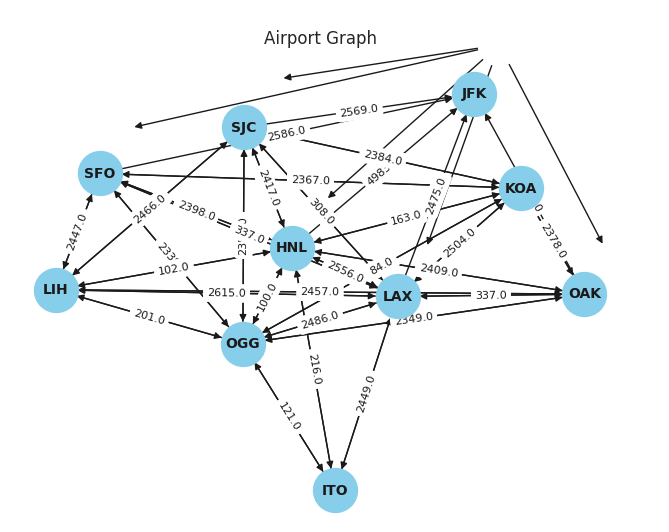

Total Number of Flights (Non Null): 1088005


In [ ]:
## Weather features
numerics_features = ["HourlyPrecipitation", "HourlyDryBulbTemperature", 
                "HourlyPressureChange", "HourlyRelativeHumidity",
                "HourlySeaLevelPressure", "HourlyStationPressure",
                "HourlyVisibility", "HourlyWindGustSpeed","HourlyWindSpeed", "ELEVATION"]

## Cast Column to Float
for c in numerics_features:
    df_flights = df_flights.withColumn(c, F.col(c).cast("Float"))

# filter out Null values from our dataset (12M)
join_keys = ['FL_DATE', 'OP_UNIQUE_CARRIER', 'TAIL_NUM', 'OP_CARRIER_FL_NUM', 'sched_depart_date_time_UTC', 'DEP_DEL15']
df_flights_numeric_non_null = df_flights.select(join_keys + numerics_features).drop(*['HourlyPressureChange', 'HourlyWindGustSpeed']).na.drop().cache()
print(f"Total Number of Flights (Non Null): {df_flights_numeric_non_null.count()}")

## Merge Data

### Merge weather with non-nulls

In [ ]:
# join data with main flights dataframe
# Merge data to obtain spacetime
df_flights_numeric_non_null = df_flights_numeric_non_null.alias('a').join(df_flights.alias('b').drop(*numerics_features+['DEP_DEL15']),
                                                                                (df_flights_numeric_non_null.FL_DATE == df_flights.FL_DATE) & 
                                                                                (df_flights_numeric_non_null.OP_UNIQUE_CARRIER == df_flights.OP_UNIQUE_CARRIER) &
                                                                                (df_flights_numeric_non_null.TAIL_NUM == df_flights.TAIL_NUM) &
                                                                                (df_flights_numeric_non_null.OP_CARRIER_FL_NUM == df_flights.OP_CARRIER_FL_NUM) &
                                                                                (df_flights_numeric_non_null.sched_depart_date_time_UTC == df_flights.sched_depart_date_time_UTC), how='left')\
                                                                    .drop(F.col("b.FL_DATE"), 
                                                                          F.col("b.OP_UNIQUE_CARRIER"), 
                                                                          F.col("b.TAIL_NUM"),
                                                                          F.col("b.OP_CARRIER_FL_NUM"), 
                                                                          F.col('b.sched_depart_date_time_UTC')).cache()

In [ ]:
print(f"Total Number of Flights (Non Null): {df_flights_numeric_non_null.count()}")

Total Number of Flights (Non Null): 1088005


### Merge Non-Nulls with RMF Table

In [ ]:
df_flights_numeric_non_null = df_flights_numeric_non_null.alias('a').join(rfm_table.alias('b'),
                                                                         (df_flights_numeric_non_null.OP_UNIQUE_CARRIER == rfm_table.OP_UNIQUE_CARRIER) &
                                                                         (df_flights_numeric_non_null.OP_CARRIER_FL_NUM == rfm_table.OP_CARRIER_FL_NUM),
                                                                          how='inner')\
                                                                    .drop(F.col("b.OP_UNIQUE_CARRIER"), 
                                                                          F.col("b.OP_CARRIER_FL_NUM")).cache()

In [ ]:
print(f"Total Number of Flights (Non Null): {df_flights_numeric_non_null.count()}")

Total Number of Flights (Non Null): 1079422


## Non-numeric bucketized flights

In [ ]:
# Filtering out to only large departure
df_flights_numeric_non_null = df_flights_numeric_non_null.filter("origin_type = 'large_airport'").cache()

In [ ]:
# Parititon the Airport into quantiles
number_of_flights = df_flights_numeric_non_null.groupby('origin_iata_code').count()
number_of_flights.summary().show()

# approxmiate the quantiles
iata_quartile = number_of_flights.approxQuantile("count", [0.00, 0.25, 0.5, 0.75, 1.00], 0)

+-------+----------------+------------------+
|summary|origin_iata_code|             count|
+-------+----------------+------------------+
|  count|             131|               131|
|   mean|            null| 7604.167938931298|
| stddev|            null|11741.359020509617|
|    min|             ABQ|                 6|
|    25%|            null|               800|
|    50%|            null|              2135|
|    75%|            null|              8992|
|    max|             VPS|             68019|
+-------+----------------+------------------+



In [ ]:
airports_number_of_flights = number_of_flights.withColumn('airport_groups',
                                                          F.when(F.col('count') < iata_quartile[0], 'A')\
                                                            .when((F.col('count') >= iata_quartile[0]) & ((F.col('count') <= iata_quartile[1])) , 'B')\
                                                            .when((F.col('count') > iata_quartile[1]) & ((F.col('count') <= iata_quartile[2])) , 'C')\
                                                            .when((F.col('count') > iata_quartile[2]) & ((F.col('count') <= iata_quartile[3])) , 'D')\
                                                            .otherwise('E')).cache()

In [ ]:
# Parititon the Carriers into quantiles
number_of_flights = df_flights_numeric_non_null.groupby('OP_UNIQUE_CARRIER').count()
number_of_flights.summary().show()

# approxmiate the quantiles
carrier_quartile = number_of_flights.approxQuantile("count", [0.00, 0.25, 0.5, 0.75, 1.00], 0)

+-------+-----------------+-----------------+
|summary|OP_UNIQUE_CARRIER|            count|
+-------+-----------------+-----------------+
|  count|               14|               14|
|   mean|             null|71153.28571428571|
| stddev|             null|61785.49768654151|
|    min|               AA|             8348|
|    25%|             null|            19133|
|    50%|             null|            49601|
|    75%|             null|            93507|
|    max|               WN|           229948|
+-------+-----------------+-----------------+



In [ ]:
carriers_number_of_flights = number_of_flights.withColumn('carrier_groups', 
                                                          F.when(F.col('count') < carrier_quartile[0], "A")\
                                                            .when((F.col('count') >= carrier_quartile[0]) & ((F.col('count') < carrier_quartile[1])) , "B")\
                                                            .when((F.col('count') >= carrier_quartile[1]) & ((F.col('count') < carrier_quartile[2])) ,"C")\
                                                            .when((F.col('count') >= carrier_quartile[2]) & ((F.col('count') < carrier_quartile[3])) , "D")\
                                                            .otherwise('E')).cache()

## Feature Consolidation

In [ ]:
df_flights_numeric_non_null = df_flights_numeric_non_null.join(airports_number_of_flights.drop(F.col('count')), ['origin_iata_code'], how='left')\
                                                            .join(carriers_number_of_flights.drop(F.col('count')), ['OP_UNIQUE_CARRIER'], how='left').cache()

## Dimensionality Reduction and One-Hot Encoding

In [ ]:
def ApplyOHE(df, col):
    """
        helper function to apply OHE
    """  
    # StringIndexer Initialization
    indexer = StringIndexer(inputCol=col, outputCol=col+"_indexed")
    indexerModel = indexer.fit(df)

    # Transform the DataFrame using the fitted StringIndexer model
    indexed_df = indexerModel.transform(df)

    # apply OneHot Encoding to the indexed column
    encoder = OneHotEncoder(inputCol=col+"_indexed", outputCol=col+"_onehot")
    odf = encoder.fit(indexed_df).transform(indexed_df)
    return odf


df_flights_numeric_non_null = ApplyOHE(df_flights_numeric_non_null, 'airport_groups')
df_flights_numeric_non_null = ApplyOHE(df_flights_numeric_non_null, 'carrier_groups')
df_flights_numeric_non_null = ApplyOHE(df_flights_numeric_non_null, 'TIME_SLOT')
df_flights_numeric_non_null = ApplyOHE(df_flights_numeric_non_null, 'SEASON')
df_flights_numeric_non_null = ApplyOHE(df_flights_numeric_non_null, 'R_Quartile')
df_flights_numeric_non_null = ApplyOHE(df_flights_numeric_non_null, 'F_Quartile')
df_flights_numeric_non_null = ApplyOHE(df_flights_numeric_non_null, 'M_Quartile')
df_flights_numeric_non_null = ApplyOHE(df_flights_numeric_non_null, 'closest_depart_time_weather_measurement')
df_flights_numeric_non_null = ApplyOHE(df_flights_numeric_non_null, 'DAY_OF_MONTH')

In [ ]:
round(df_flights_numeric_non_null.filter("DEP_DEL15 = '1'").count()/df_flights_numeric_non_null.count(), 3)

0.199

## PCA Explained Variance Search 
Start PCA Analysis with a plot of the correlation matrix to identify the most correlated features. PCA are extremely useful to dimensionally reduced highly correlated features to avoid autocorrelation.

In [ ]:
# plot correlation matrix
# Serialize the weather features
numeric_features = ["HourlyPrecipitation", "HourlyDryBulbTemperature", 
                    "HourlyRelativeHumidity", "HourlySeaLevelPressure", 
                    "HourlyStationPressure", "HourlyVisibility",
                    "HourlyWindSpeed", "IS_HOLIDAY", "HOLIDAY_RUSH", 
                    "Recency", "Monetary", "Frequency",
                    "degree_centrality", "betweenness_centrality",
                    "closeness_centrality", "airport_rank", 'ELEVATION', "DEP_DEL15"]

In [ ]:
if run_corr_matrix:
    # Generate the correlation matrix from the selected numeric features
    assembler = VectorAssembler(inputCols=numeric_features, 
                                outputCol="corr_features")
    df_flights_numeric_non_null_vector = assembler.transform(df_flights_numeric_non_null).select("corr_features")
    matrix = Correlation.corr(df_flights_numeric_non_null_vector, "corr_features")

    tMatrix = matrix.collect()[0][0]
    corrmatrix = tMatrix.toArray().tolist()

    def plot_corr_matrix(correlations,attr,fig_no):
        fig=plt.figure(fig_no, figsize=(20,20))
        ax=fig.add_subplot(111)
        ax = sns.heatmap(correlations, annot=True)
        ax.set_title("Correlation Matrix for Specified Attributes")
        ax.set_xticklabels(attr, rotation = 45)
        ax.set_yticklabels(attr, rotation = 45)
        plt.show()

    plot_corr_matrix(corrmatrix, numeric_features, 234)

# Train/test split

In [ ]:
# Filter the DataFrame based on the year
df_flights_numeric_non_null = df_flights_numeric_non_null.select("*").orderBy(F.rand())

if random_split:
    ## random split
    train, test = df_flights_numeric_non_null.randomSplit([.8, .2], 512)
else:
    ## time series split on year
    train = df_flights_numeric_non_null.filter(df_flights_numeric_non_null['YEAR'].isin(2015, 2016, 2017, 2018))
    test = df_flights_numeric_non_null.filter(df_flights_numeric_non_null['YEAR'] == 2019)

In [ ]:
## Don't need to run this on large set
if run_PCA_analysis:
    # Run PCA Explain Variance Plot
    assembler = VectorAssembler(inputCols=numeric_features, outputCol="features")
    trainDF_VA = assembler.transform(train)

    scaler = StandardScaler(inputCol="features", outputCol="features_scaled")
    scaler_fit = scaler.fit(trainDF_VA)
    trainDF_VA = scaler_fit.transform(trainDF_VA)

    # begin PCA
    pca = PCA(k=len(numeric_features), inputCol="features_scaled", outputCol='pca_features')
    pca_applied = pca.fit(trainDF_VA)
    exp_var_pca = pca_applied.explainedVariance
    cum_sum_eigenvalues = np.cumsum(exp_var_pca)

    # print("Begin Plotting Explaination of Variance")
    # Create the visualization plot
    plt.clf()
    plt.bar(range(0,len(exp_var_pca)), exp_var_pca, 
            alpha=0.5, align='center', 
            label='Individual explained variance')
    plt.step(range(0,len(cum_sum_eigenvalues)), 
            cum_sum_eigenvalues, 
            where='mid',
            label='Cumulative explained variance')
    plt.ylabel('Explained variance ratio')
    plt.xlabel('Principal component index')
    plt.legend(loc='best')
    plt.title(f"PCA Explained Variance Plot")
    plt.show()

# Modelings & Pipeline

## Pipeline Overview

After Performing Feature Engineered and train test split our data, we fitted four different models onto the trained data set. There are two types of features in our model, numerics features, which takes on any decimal values, and one-hot encoded features, which represents categorical features. While the list of input features changes across iterations, across all experiment performed onto our dataset, we detrmine that the follows are the best numeric features and one-hot encoded features across all model:
|Feature Type| Faetures|
|------------|---------|
|numeric_features | ["HourlyPrecipitation", "HourlyDryBulbTemperature", "HourlyRelativeHumidity", "HourlySeaLevelPressure", "HourlyStationPressure", "HourlyVisibility", "HourlyWindSpeed", "IS_HOLIDAY", "HOLIDAY_RUSH", "Recency", "Monetary", "Frequency", "ELEVATION", "degree_centrality", "betweenness_centrality", "closeness_centrality", "airport_rank"]|
|onehot_features | ["R_Quartile_onehot", "F_Quartile_onehot", "M_Quartile_onehot", "weather_condition_measured_time_from_depart", "closest_depart_time_weather_measurement_onehot", "SEASON_onehot", "TIME_SLOT_onehot", "airport_groups_onehot", "carrier_groups_onehot"]' |


For determination of flight delay indicator (DEP_DEL15), we decided to use AUC because it is a calibrated trade-off between sensitivy and specifity.One way of interpreting AUC is as the probability that the model ranks a random positive example more highly than a random negative example ([Google, Classication: ROC curve and AUC](https://developers.google.com/machine-learning/crash-course/classification/roc-and-auc)).

In [ ]:
# import requests
# from IPython.display import display, Image
# # ![model_pipeline](http://13.66.213.192/w261/generic_model_pipeline-2.png)
# # URL of the image
# image_url = "http://13.66.213.192/w261/generic_model_pipeline-2.png"

# # Use requests to get the image
# response = requests.get(image_url)

# # Check if the request was successful (status code 200)
# if response.status_code == 200:
#     # Display the image in the notebook
#     img = Image(response.content)
#     display(img)
# else:
#     print(f"Image is not accessible. Status code: {response.status_code}")
    

## Experiments:

For this iteration, we performed a total of 34 experiments. Table 1 below reported our findings on all experiments. Across all fitted models, Logistic regression performed the best of the held out test set, reported an AUC score of 0.697 for the 3M dataset, 0.635524 for the 12M dataset, and 0.656062 for 2019 held out test set. Compared to each baseline experiment, where we predicted the majority class (no delay), this is an improvement of 39.4% for the 3M dataset, 27.0% for 12M dataset, and 31.2% for the held out 2019 dataset.


### Table 1: No-CV Tuned model
| Duration | dataset_name | family                       | featuresCol_1                                                                                                                                                                                                                                                                                                                                 | featuresCol_2                                                                                                                                                                                                                                           | labelCol  | test_AUC | test_accuracy | test_precision | test_recall |
| -------- | ------------ | ---------------------------- | --------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------- | ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------- | --------- | -------- | ------------- | -------------- | ----------- |
| 15.0min  | OTPW_3M      | binomial logistic regression | ['HourlyPrecipitation', 'HourlyDryBulbTemperature', 'HourlyRelativeHumidity', 'HourlySeaLevelPressure', 'HourlyStationPressure', 'HourlyVisibility', 'HourlyWindSpeed', 'IS_HOLIDAY', 'HOLIDAY_RUSH', 'Recency', 'Monetary', 'Frequency', 'ELEVATION', 'degree_centrality', 'betweenness_centrality', 'closeness_centrality', 'airport_rank'] | ['R_Quartile_onehot', 'F_Quartile_onehot', 'F_Quartile_onehot', 'weather_condition_measured_time_from_depart', 'closest_depart_time_weather_measurement_onehot', 'SEASON_onehot', 'TIME_SLOT_onehot', 'airport_groups_onehot', 'carrier_groups_onehot'] | DEP_DEL15 | 0.697641 | 0.802631      | 0.760873       | 0.802631    |
| 15.5min  | OTPW_3M      | binomial logistic regression | ['HourlyPrecipitation', 'HourlyDryBulbTemperature', 'HourlyPressureChange', 'HourlyRelativeHumidity', 'HourlySeaLevelPressure', 'HourlyStationPressure', 'HourlyVisibility', 'HourlyWindGustSpeed', 'HourlyWindSpeed']                                                                                                                        | ['R_Quartile_onehot', 'F_Quartile_onehot', 'F_Quartile_onehot', 'weather_condition_measured_time_from_depart', 'closest_depart_time_weather_measurement_onehot', 'SEASON_onehot', 'TIME_SLOT_onehot', 'airport_groups_onehot', 'carrier_groups_onehot'] | DEP_DEL15 | 0.696678 | 0.804706      | 0.764423       | 0.804706    |
| 7.0min   | OTPW_3M      | binomial logistic regression | ['HourlyPrecipitation', 'HourlyDryBulbTemperature', 'HourlyRelativeHumidity', 'HourlySeaLevelPressure', 'HourlyStationPressure', 'HourlyVisibility', 'HourlyWindSpeed', 'IS_HOLIDAY', 'HOLIDAY_RUSH', 'time_apart_min', 'Recency', 'Monetary', 'Frequency']                                                                                   | ['R_Quartile_onehot', 'F_Quartile_onehot', 'F_Quartile_onehot', 'weather_condition_measured_time_from_depart', 'closest_depart_time_weather_measurement_onehot', 'SEASON_onehot', 'TIME_SLOT_onehot', 'airport_groups_onehot', 'carrier_groups_onehot'] | DEP_DEL15 | 0.693957 | 0.802718      | 0.764943       | 0.802718    |
| 5.6min   | OTPW_3M      | binomial logistic regression | ['HourlyPrecipitation', 'HourlyDryBulbTemperature', 'HourlyRelativeHumidity', 'HourlySeaLevelPressure', 'HourlyStationPressure', 'HourlyVisibility', 'HourlyWindSpeed', 'IS_HOLIDAY', 'HOLIDAY_RUSH', 'Recency', 'Monetary', 'Frequency']                                                                                                     | ['R_Quartile_onehot', 'F_Quartile_onehot', 'F_Quartile_onehot', 'weather_condition_measured_time_from_depart', 'closest_depart_time_weather_measurement_onehot', 'SEASON_onehot', 'TIME_SLOT_onehot', 'airport_groups_onehot', 'carrier_groups_onehot'] | DEP_DEL15 | 0.693769 | 0.802083      | 0.772737       | 0.802083    |
| 3.6min   | OTPW_3M      | binomial logistic regression | ['HourlyPrecipitation', 'HourlyDryBulbTemperature', 'HourlyRelativeHumidity', 'HourlySeaLevelPressure', 'HourlyStationPressure', 'HourlyVisibility', 'HourlyWindSpeed', 'IS_HOLIDAY', 'HOLIDAY_RUSH', 'Recency', 'Monetary', 'Frequency']                                                                                                     | ['R_Quartile_onehot', 'F_Quartile_onehot', 'F_Quartile_onehot', 'weather_condition_measured_time_from_depart', 'closest_depart_time_weather_measurement_onehot', 'SEASON_onehot', 'TIME_SLOT_onehot', 'airport_groups_onehot', 'carrier_groups_onehot'] | DEP_DEL15 | 0.692205 | 0.805015      | 0.769527       | 0.805015    |
| 2.9min   | OTPW_60M     | binomial logistic regression | ['HourlyPrecipitation', 'HourlyDryBulbTemperature', 'HourlyRelativeHumidity', 'HourlySeaLevelPressure', 'HourlyStationPressure', 'HourlyVisibility', 'HourlyWindSpeed', 'IS_HOLIDAY', 'HOLIDAY_RUSH', 'Recency', 'Monetary', 'Frequency', 'ELEVATION', 'degree_centrality', 'betweenness_centrality', 'closeness_centrality', 'airport_rank'] | ['R_Quartile_onehot', 'F_Quartile_onehot', 'F_Quartile_onehot', 'weather_condition_measured_time_from_depart', 'closest_depart_time_weather_measurement_onehot', 'SEASON_onehot', 'TIME_SLOT_onehot', 'airport_groups_onehot', 'carrier_groups_onehot'] | DEP_DEL15 | 0.656062 | 0.817303      | 0.768425       | 0.817303    |
| 5.9min   | OTPW_12M     | binomial logistic regression | ['HourlyPrecipitation', 'HourlyDryBulbTemperature', 'HourlyRelativeHumidity', 'HourlySeaLevelPressure', 'HourlyStationPressure', 'HourlyVisibility', 'HourlyWindSpeed', 'IS_HOLIDAY', 'HOLIDAY_RUSH', 'weather_condition_measured_time_from_depart']                                                                                          | ['R_Quartile_onehot', 'F_Quartile_onehot', 'F_Quartile_onehot', 'weather_condition_measured_time_from_depart', 'closest_depart_time_weather_measurement_onehot', 'SEASON_onehot', 'TIME_SLOT_onehot', 'airport_groups_onehot', 'carrier_groups_onehot'] | DEP_DEL15 | 0.635524 | 0.802888      | 0.737436       | 0.802888    |
| 8.2min   | OTPW_3M      | Gradient Boosting Classifier | ['HourlyPrecipitation', 'HourlyDryBulbTemperature', 'HourlyRelativeHumidity', 'HourlySeaLevelPressure', 'HourlyStationPressure', 'HourlyVisibility', 'HourlyWindSpeed', 'IS_HOLIDAY', 'HOLIDAY_RUSH', 'Recency', 'Monetary', 'Frequency', 'ELEVATION', 'degree_centrality', 'betweenness_centrality', 'closeness_centrality', 'airport_rank'] | ['R_Quartile_onehot', 'F_Quartile_onehot', 'F_Quartile_onehot', 'weather_condition_measured_time_from_depart', 'closest_depart_time_weather_measurement_onehot', 'SEASON_onehot', 'TIME_SLOT_onehot', 'airport_groups_onehot', 'carrier_groups_onehot'] | DEP_DEL15 | 0.537543 | 0.745222      | 0.745276       | 0.744245    |
| 2.4min   | OTPW_12M     | binary decision tree         | ['HourlyPrecipitation', 'HourlyDryBulbTemperature', 'HourlyRelativeHumidity', 'HourlySeaLevelPressure', 'HourlyStationPressure', 'HourlyVisibility', 'HourlyWindSpeed', 'IS_HOLIDAY', 'HOLIDAY_RUSH', 'Recency', 'Monetary', 'Frequency']                                                                                                     | ['R_Quartile_onehot', 'F_Quartile_onehot', 'F_Quartile_onehot', 'weather_condition_measured_time_from_depart', 'closest_depart_time_weather_measurement_onehot', 'SEASON_onehot', 'TIME_SLOT_onehot', 'airport_groups_onehot', 'carrier_groups_onehot'] | DEP_DEL15 | 0.524965 | 0.736261      | 0.736261       | 0.736261    |
| 5.1min   | OTPW_60M     | binary decision tree         | ['HourlyPrecipitation', 'HourlyDryBulbTemperature', 'HourlyRelativeHumidity', 'HourlySeaLevelPressure', 'HourlyStationPressure', 'HourlyVisibility', 'HourlyWindSpeed', 'IS_HOLIDAY', 'HOLIDAY_RUSH', 'Recency', 'Monetary', 'Frequency', 'ELEVATION', 'degree_centrality', 'betweenness_centrality', 'closeness_centrality', 'airport_rank'] | ['R_Quartile_onehot', 'F_Quartile_onehot', 'F_Quartile_onehot', 'weather_condition_measured_time_from_depart', 'closest_depart_time_weather_measurement_onehot', 'SEASON_onehot', 'TIME_SLOT_onehot', 'airport_groups_onehot', 'carrier_groups_onehot'] | DEP_DEL15 | 0.515814 | 0.746065      | 0.746065       | 0.746065    |
| 9.0min   | OTPW_3M      | binary decision tree         | ['HourlyPrecipitation', 'HourlyDryBulbTemperature', 'HourlyRelativeHumidity', 'HourlySeaLevelPressure', 'HourlyStationPressure', 'HourlyVisibility', 'HourlyWindSpeed', 'IS_HOLIDAY', 'HOLIDAY_RUSH', 'Recency', 'Monetary', 'Frequency', 'ELEVATION', 'degree_centrality', 'betweenness_centrality', 'closeness_centrality', 'airport_rank'] | ['R_Quartile_onehot', 'F_Quartile_onehot', 'F_Quartile_onehot', 'weather_condition_measured_time_from_depart', 'closest_depart_time_weather_measurement_onehot', 'SEASON_onehot', 'TIME_SLOT_onehot', 'airport_groups_onehot', 'carrier_groups_onehot'] | DEP_DEL15 | 0.513612 | 0.724226      | 0.725219       | 0.724181    |
| 20.4min  | OTPW_3M      | Ranfom Forest Classifier     | ['HourlyPrecipitation', 'HourlyDryBulbTemperature', 'HourlyRelativeHumidity', 'HourlySeaLevelPressure', 'HourlyStationPressure', 'HourlyVisibility', 'HourlyWindSpeed', 'IS_HOLIDAY', 'HOLIDAY_RUSH', 'Recency', 'Monetary', 'Frequency', 'ELEVATION', 'degree_centrality', 'betweenness_centrality', 'closeness_centrality', 'airport_rank'] | ['R_Quartile_onehot', 'F_Quartile_onehot', 'F_Quartile_onehot', 'weather_condition_measured_time_from_depart', 'closest_depart_time_weather_measurement_onehot', 'SEASON_onehot', 'TIME_SLOT_onehot', 'airport_groups_onehot', 'carrier_groups_onehot'] | DEP_DEL15 | 0.513486 | 0.725809      | 0.72416        | 0.724419    |
| 13.6min  | OTPW_3M      | binary decision tree         | ['HourlyPrecipitation', 'HourlyDryBulbTemperature', 'HourlyPressureChange', 'HourlyRelativeHumidity', 'HourlySeaLevelPressure', 'HourlyStationPressure', 'HourlyVisibility', 'HourlyWindGustSpeed', 'HourlyWindSpeed']                                                                                                                        | ['R_Quartile_onehot', 'F_Quartile_onehot', 'F_Quartile_onehot', 'weather_condition_measured_time_from_depart', 'closest_depart_time_weather_measurement_onehot', 'SEASON_onehot', 'TIME_SLOT_onehot', 'airport_groups_onehot', 'carrier_groups_onehot'] | DEP_DEL15 | 0.512232 | 0.724708      | 0.725077       | 0.724041    |
| 26.3min  | OTPW_12M     | Ranfom Forest Classifier     | ['HourlyPrecipitation', 'HourlyDryBulbTemperature', 'HourlyPressureChange', 'HourlyRelativeHumidity', 'HourlySeaLevelPressure', 'HourlyStationPressure', 'HourlyVisibility', 'HourlyWindGustSpeed', 'HourlyWindSpeed']                                                                                                                        | ['R_Quartile_onehot', 'F_Quartile_onehot', 'F_Quartile_onehot', 'weather_condition_measured_time_from_depart', 'closest_depart_time_weather_measurement_onehot', 'SEASON_onehot', 'TIME_SLOT_onehot', 'airport_groups_onehot', 'carrier_groups_onehot'] | DEP_DEL15 | 0.512027 | 0.722988      | 0.724497       | 0.725309    |
| 5.5min   | OTPW_3M      | binary decision tree         | ['HourlyPrecipitation', 'HourlyDryBulbTemperature', 'HourlyRelativeHumidity', 'HourlySeaLevelPressure', 'HourlyStationPressure', 'HourlyVisibility', 'HourlyWindSpeed', 'IS_HOLIDAY', 'HOLIDAY_RUSH', 'time_apart_min', 'Recency', 'Monetary', 'Frequency']                                                                                   | ['R_Quartile_onehot', 'F_Quartile_onehot', 'F_Quartile_onehot', 'weather_condition_measured_time_from_depart', 'closest_depart_time_weather_measurement_onehot', 'SEASON_onehot', 'TIME_SLOT_onehot', 'airport_groups_onehot', 'carrier_groups_onehot'] | DEP_DEL15 | 0.511486 | 0.722601      | 0.722601       | 0.722601    |
| 4.4min   | OTPW_3M      | binary decision tree         | ['HourlyPrecipitation', 'HourlyDryBulbTemperature', 'HourlyRelativeHumidity', 'HourlySeaLevelPressure', 'HourlyStationPressure', 'HourlyVisibility', 'HourlyWindSpeed', 'IS_HOLIDAY', 'HOLIDAY_RUSH', 'Recency', 'Monetary', 'Frequency']                                                                                                     | ['R_Quartile_onehot', 'F_Quartile_onehot', 'F_Quartile_onehot', 'weather_condition_measured_time_from_depart', 'closest_depart_time_weather_measurement_onehot', 'SEASON_onehot', 'TIME_SLOT_onehot', 'airport_groups_onehot', 'carrier_groups_onehot'] | DEP_DEL15 | 0.508533 | 0.720134      | 0.720134       | 0.720134    |
| 3.8min   | OTPW_60M     | Gradient Boosting Classifier | ['HourlyPrecipitation', 'HourlyDryBulbTemperature', 'HourlyRelativeHumidity', 'HourlySeaLevelPressure', 'HourlyStationPressure', 'HourlyVisibility', 'HourlyWindSpeed', 'IS_HOLIDAY', 'HOLIDAY_RUSH', 'Recency', 'Monetary', 'Frequency', 'ELEVATION', 'degree_centrality', 'betweenness_centrality', 'closeness_centrality', 'airport_rank'] | ['R_Quartile_onehot', 'F_Quartile_onehot', 'F_Quartile_onehot', 'weather_condition_measured_time_from_depart', 'closest_depart_time_weather_measurement_onehot', 'SEASON_onehot', 'TIME_SLOT_onehot', 'airport_groups_onehot', 'carrier_groups_onehot'] | DEP_DEL15 | 0.505296 | 0.739331      | 0.739331       | 0.739331    |
| 3.1min   | OTPW_3M      | binary decision tree         | ['HourlyPrecipitation', 'HourlyDryBulbTemperature', 'HourlyRelativeHumidity', 'HourlySeaLevelPressure', 'HourlyStationPressure', 'HourlyVisibility', 'HourlyWindSpeed', 'IS_HOLIDAY', 'HOLIDAY_RUSH', 'weather_condition_measured_time_from_depart']                                                                                          | ['R_Quartile_onehot', 'F_Quartile_onehot', 'F_Quartile_onehot', 'weather_condition_measured_time_from_depart', 'closest_depart_time_weather_measurement_onehot', 'SEASON_onehot', 'TIME_SLOT_onehot', 'airport_groups_onehot', 'carrier_groups_onehot'] | DEP_DEL15 | 0.501075 | 0.716182      | 0.716182       | 0.716182    |
| 53.6min  | OTPW_60M     | Ranfom Forest Classifier     | ['HourlyPrecipitation', 'HourlyDryBulbTemperature', 'HourlyRelativeHumidity', 'HourlySeaLevelPressure', 'HourlyStationPressure', 'HourlyVisibility', 'HourlyWindSpeed', 'IS_HOLIDAY', 'HOLIDAY_RUSH', 'Recency', 'Monetary', 'Frequency', 'ELEVATION', 'degree_centrality', 'betweenness_centrality', 'closeness_centrality', 'airport_rank'] | ['R_Quartile_onehot', 'F_Quartile_onehot', 'F_Quartile_onehot', 'weather_condition_measured_time_from_depart', 'closest_depart_time_weather_measurement_onehot', 'SEASON_onehot', 'TIME_SLOT_onehot', 'airport_groups_onehot', 'carrier_groups_onehot'] | DEP_DEL15 | 0.5      | 0.734695      | 0.734695       | 0.734695    |
| 1.2min   | OTPW_12M     | majority class               | ['HourlyPrecipitation', 'HourlyDryBulbTemperature', 'HourlyRelativeHumidity', 'HourlySeaLevelPressure', 'HourlyStationPressure', 'HourlyVisibility', 'HourlyWindSpeed', 'IS_HOLIDAY', 'HOLIDAY_RUSH', 'Recency', 'Monetary', 'Frequency']                                                                                                     | ['R_Quartile_onehot', 'F_Quartile_onehot', 'F_Quartile_onehot', 'weather_condition_measured_time_from_depart', 'closest_depart_time_weather_measurement_onehot', 'SEASON_onehot', 'TIME_SLOT_onehot', 'airport_groups_onehot', 'carrier_groups_onehot'] | DEP_DEL15 | 0.5      | 0.71198       | 0.71198        | 0.71198     |
| 58.6s    | OTPW_3M      | majority class               | ['HourlyPrecipitation', 'HourlyDryBulbTemperature', 'HourlyRelativeHumidity', 'HourlySeaLevelPressure', 'HourlyStationPressure', 'HourlyVisibility', 'HourlyWindSpeed', 'IS_HOLIDAY', 'HOLIDAY_RUSH', 'Recency', 'Monetary', 'Frequency']                                                                                                     | ['R_Quartile_onehot', 'F_Quartile_onehot', 'F_Quartile_onehot', 'weather_condition_measured_time_from_depart', 'closest_depart_time_weather_measurement_onehot', 'SEASON_onehot', 'TIME_SLOT_onehot', 'airport_groups_onehot', 'carrier_groups_onehot'] | DEP_DEL15 | 0.5      | 0.714017      | 0.714017       | 0.714017    |
| 36.4s    | OTPW_3M      | majority class               | ['HourlyPrecipitation', 'HourlyDryBulbTemperature', 'HourlyRelativeHumidity', 'HourlySeaLevelPressure', 'HourlyStationPressure', 'HourlyVisibility', 'HourlyWindSpeed', 'IS_HOLIDAY', 'HOLIDAY_RUSH', 'weather_condition_measured_time_from_depart']                                                                                          | ['R_Quartile_onehot', 'F_Quartile_onehot', 'F_Quartile_onehot', 'weather_condition_measured_time_from_depart', 'closest_depart_time_weather_measurement_onehot', 'SEASON_onehot', 'TIME_SLOT_onehot', 'airport_groups_onehot', 'carrier_groups_onehot'] | DEP_DEL15 | 0.5      | 0.715121      | 0.715121       | 0.715121    |
| 4.7min   | OTPW_3M      | majority class               | ['HourlyPrecipitation', 'HourlyDryBulbTemperature', 'HourlyRelativeHumidity', 'HourlySeaLevelPressure', 'HourlyStationPressure', 'HourlyVisibility', 'HourlyWindSpeed', 'IS_HOLIDAY', 'HOLIDAY_RUSH', 'Recency', 'Monetary', 'Frequency', 'ELEVATION', 'degree_centrality', 'betweenness_centrality', 'closeness_centrality', 'airport_rank'] | ['R_Quartile_onehot', 'F_Quartile_onehot', 'F_Quartile_onehot', 'weather_condition_measured_time_from_depart', 'closest_depart_time_weather_measurement_onehot', 'SEASON_onehot', 'TIME_SLOT_onehot', 'airport_groups_onehot', 'carrier_groups_onehot'] | DEP_DEL15 | 0.5      | 0.712532      | 0.712403       | 0.712514    |
| 7.0min   | OTPW_12M     | majority class               | ['HourlyPrecipitation', 'HourlyDryBulbTemperature', 'HourlyPressureChange', 'HourlyRelativeHumidity', 'HourlySeaLevelPressure', 'HourlyStationPressure', 'HourlyVisibility', 'HourlyWindGustSpeed', 'HourlyWindSpeed']                                                                                                                        | ['R_Quartile_onehot', 'F_Quartile_onehot', 'F_Quartile_onehot', 'weather_condition_measured_time_from_depart', 'closest_depart_time_weather_measurement_onehot', 'SEASON_onehot', 'TIME_SLOT_onehot', 'airport_groups_onehot', 'carrier_groups_onehot'] | DEP_DEL15 | 0.5      | 0.710948      | 0.713924       | 0.711815    |
| 2.6min   | OTPW_3M      | majority class               | ['HourlyPrecipitation', 'HourlyDryBulbTemperature', 'HourlyRelativeHumidity', 'HourlySeaLevelPressure', 'HourlyStationPressure', 'HourlyVisibility', 'HourlyWindSpeed', 'IS_HOLIDAY', 'HOLIDAY_RUSH', 'time_apart_min', 'Recency', 'Monetary', 'Frequency']                                                                                   | ['R_Quartile_onehot', 'F_Quartile_onehot', 'F_Quartile_onehot', 'weather_condition_measured_time_from_depart', 'closest_depart_time_weather_measurement_onehot', 'SEASON_onehot', 'TIME_SLOT_onehot', 'airport_groups_onehot', 'carrier_groups_onehot'] | DEP_DEL15 | 0.5      | 0.711731      | 0.711731       | 0.711731    |
| 29.1s    | OTPW_60M     | majority class               | ['HourlyPrecipitation', 'HourlyDryBulbTemperature', 'HourlyRelativeHumidity', 'HourlySeaLevelPressure', 'HourlyStationPressure', 'HourlyVisibility', 'HourlyWindSpeed', 'IS_HOLIDAY', 'HOLIDAY_RUSH', 'Recency', 'Monetary', 'Frequency', 'ELEVATION', 'degree_centrality', 'betweenness_centrality', 'closeness_centrality', 'airport_rank'] | ['R_Quartile_onehot', 'F_Quartile_onehot', 'F_Quartile_onehot', 'weather_condition_measured_time_from_depart', 'closest_depart_time_weather_measurement_onehot', 'SEASON_onehot', 'TIME_SLOT_onehot', 'airport_groups_onehot', 'carrier_groups_onehot'] | DEP_DEL15 | 0.5      | 0.734695      | 0.734695       | 0.734695    |
| 10.8min  | OTPW_3M      | majority class               | ['HourlyPrecipitation', 'HourlyDryBulbTemperature', 'HourlyRelativeHumidity', 'HourlySeaLevelPressure', 'HourlyStationPressure', 'HourlyVisibility', 'HourlyWindSpeed', 'IS_HOLIDAY', 'HOLIDAY_RUSH', 'Recency', 'Monetary', 'Frequency', 'ELEVATION', 'degree_centrality', 'betweenness_centrality', 'closeness_centrality', 'airport_rank'] | ['R_Quartile_onehot', 'F_Quartile_onehot', 'F_Quartile_onehot', 'weather_condition_measured_time_from_depart', 'closest_depart_time_weather_measurement_onehot', 'SEASON_onehot', 'TIME_SLOT_onehot', 'airport_groups_onehot', 'carrier_groups_onehot'] | DEP_DEL15 | 0.5      | 0.713294      | 0.712194       | 0.711574    |
| 6.9min   | OTPW_3M      | majority class               | ['HourlyPrecipitation', 'HourlyDryBulbTemperature', 'HourlyPressureChange', 'HourlyRelativeHumidity', 'HourlySeaLevelPressure', 'HourlyStationPressure', 'HourlyVisibility', 'HourlyWindGustSpeed', 'HourlyWindSpeed']                                                                                                                        | ['R_Quartile_onehot', 'F_Quartile_onehot', 'F_Quartile_onehot', 'weather_condition_measured_time_from_depart', 'closest_depart_time_weather_measurement_onehot', 'SEASON_onehot', 'TIME_SLOT_onehot', 'airport_groups_onehot', 'carrier_groups_onehot'] | DEP_DEL15 | 0.5      | 0.711504      | 0.713606       | 0.712368    |
| 7.0min   | OTPW_3M      | majority class               | ['HourlyPrecipitation', 'HourlyDryBulbTemperature', 'HourlyPressureChange', 'HourlyRelativeHumidity', 'HourlySeaLevelPressure', 'HourlyStationPressure', 'HourlyVisibility', 'HourlyWindGustSpeed', 'HourlyWindSpeed']                                                                                                                        | ['R_Quartile_onehot', 'F_Quartile_onehot', 'F_Quartile_onehot', 'weather_condition_measured_time_from_depart', 'closest_depart_time_weather_measurement_onehot', 'SEASON_onehot', 'TIME_SLOT_onehot', 'airport_groups_onehot', 'carrier_groups_onehot'] | DEP_DEL15 | 0.5      | 0.714365      | 0.71217        | 0.709921    |
| 2.7min   | OTPW_3M      | majority class               | ['HourlyPrecipitation', 'HourlyDryBulbTemperature', 'HourlyRelativeHumidity', 'HourlySeaLevelPressure', 'HourlyStationPressure', 'HourlyVisibility', 'HourlyWindSpeed', 'IS_HOLIDAY', 'HOLIDAY_RUSH', 'time_apart_min', 'Recency', 'Monetary', 'Frequency']                                                                                   | ['R_Quartile_onehot', 'F_Quartile_onehot', 'F_Quartile_onehot', 'weather_condition_measured_time_from_depart', 'closest_depart_time_weather_measurement_onehot', 'SEASON_onehot', 'TIME_SLOT_onehot', 'airport_groups_onehot', 'carrier_groups_onehot'] | DEP_DEL15 | 0.5      | 0.711731      | 0.711731       | 0.711731    |
| 30.9s    | OTPW_60M     | majority class               | ['HourlyPrecipitation', 'HourlyDryBulbTemperature', 'HourlyRelativeHumidity', 'HourlySeaLevelPressure', 'HourlyStationPressure', 'HourlyVisibility', 'HourlyWindSpeed', 'IS_HOLIDAY', 'HOLIDAY_RUSH', 'Recency', 'Monetary', 'Frequency', 'ELEVATION', 'degree_centrality', 'betweenness_centrality', 'closeness_centrality', 'airport_rank'] | ['R_Quartile_onehot', 'F_Quartile_onehot', 'F_Quartile_onehot', 'weather_condition_measured_time_from_depart', 'closest_depart_time_weather_measurement_onehot', 'SEASON_onehot', 'TIME_SLOT_onehot', 'airport_groups_onehot', 'carrier_groups_onehot'] | DEP_DEL15 | 0.5      | 0.734695      | 0.734695       | 0.734695    |
| 7.3min   | OTPW_3M      | majority class               | ['HourlyPrecipitation', 'HourlyDryBulbTemperature', 'HourlyRelativeHumidity', 'HourlySeaLevelPressure', 'HourlyStationPressure', 'HourlyVisibility', 'HourlyWindSpeed', 'IS_HOLIDAY', 'HOLIDAY_RUSH', 'Recency', 'Monetary', 'Frequency', 'ELEVATION', 'degree_centrality', 'betweenness_centrality', 'closeness_centrality', 'airport_rank'] | ['R_Quartile_onehot', 'F_Quartile_onehot', 'F_Quartile_onehot', 'weather_condition_measured_time_from_depart', 'closest_depart_time_weather_measurement_onehot', 'SEASON_onehot', 'TIME_SLOT_onehot', 'airport_groups_onehot', 'carrier_groups_onehot'] | DEP_DEL15 | 0.5      | 0.712909      | 0.713183       | 0.711072    |
| 21.3min  | OTPW_12M     | majority class               | ['HourlyPrecipitation', 'HourlyDryBulbTemperature', 'HourlyRelativeHumidity', 'HourlySeaLevelPressure', 'HourlyStationPressure', 'HourlyVisibility', 'HourlyWindSpeed', 'IS_HOLIDAY', 'HOLIDAY_RUSH', 'time_apart_min', 'Recency', 'Monetary', 'Frequency']                                                                                   | ['R_Quartile_onehot', 'F_Quartile_onehot', 'F_Quartile_onehot', 'weather_condition_measured_time_from_depart', 'closest_depart_time_weather_measurement_onehot', 'SEASON_onehot', 'TIME_SLOT_onehot', 'airport_groups_onehot', 'carrier_groups_onehot'] | DEP_DEL15 | 0.5      | 0.711731      | 0.711731       | 0.711731    |
| 29.3s    | OTPW_60M     | majority class               | ['HourlyPrecipitation', 'HourlyDryBulbTemperature', 'HourlyRelativeHumidity', 'HourlySeaLevelPressure', 'HourlyStationPressure', 'HourlyVisibility', 'HourlyWindSpeed', 'IS_HOLIDAY', 'HOLIDAY_RUSH', 'Recency', 'Monetary', 'Frequency', 'ELEVATION', 'degree_centrality', 'betweenness_centrality', 'closeness_centrality', 'airport_rank'] | ['R_Quartile_onehot', 'F_Quartile_onehot', 'F_Quartile_onehot', 'weather_condition_measured_time_from_depart', 'closest_depart_time_weather_measurement_onehot', 'SEASON_onehot', 'TIME_SLOT_onehot', 'airport_groups_onehot', 'carrier_groups_onehot'] | DEP_DEL15 | 0.5      | 0.734695      | 0.734695       | 0.734695    |

In [ ]:
# import requests
# from IPython.display import display, Image
# #![Experimental metrics plots](http://13.66.213.192/w261/experimental_metrics_plots.png)
# # URL of the image
# image_url = "http://13.66.213.192/w261/experimental_metrics_plots.png"

# # Use requests to get the image
# response = requests.get(image_url)

# # Check if the request was successful (status code 200)
# if response.status_code == 200:
#     # Display the image in the notebook
#     img = Image(response.content)
#     display(img)
# else:
#     print(f"Image is not accessible. Status code: {response.status_code}")
    

## Feature Engineering Pipeline

In [ ]:
# Create a pipeline to fully transform the data
STANDARD_FEATURE_COLNAME = "input_features"
STANDARD_LABEL_COLNAME = "DEP_DEL15"
def prepareDataSets(train, test, inputFeatures, onehotFeatures=[], doPCA=False, standardScale=False):
    '''
    Gets the train/test split, inputFeatures, and any one-hot encoded features and returns a train and test
    dataframe assembled ready to pipe into an Estimator (e.g. LogisticRegression) for training a model
    Optionally performs PCA and standard scaling on `inputFeatures`.
    '''

    outColva1 = "wFeatures"
    outCol = outColva1
    va1 = VectorAssembler(inputCols=inputFeatures, outputCol=outColva1)

    pipeline_stages = [va1]

    if standardScale:
        ## Standard Scaler
        outColScaler = "wFeatures_scaled"
        outCol = outColScaler
        standard_scaler = StandardScaler(inputCol=outColva1, outputCol=outColScaler)
        pipeline_stages.append(standard_scaler)

    if doPCA:
        ## PCA dimensionally reduction piece
        outColPCA = 'pca_wFeatures'
        outCol = outColPCA
        pca = PCA(k=10, inputCol=outColScaler, outputCol=outColPCA)
        pipeline_stages.append(pca)

    ## Serialize all remaining features
    complete_features = [outCol] + onehotFeatures
    final_assembler = VectorAssembler(inputCols=complete_features, outputCol=STANDARD_FEATURE_COLNAME)
    pipeline_stages.append(final_assembler)


    ## Setup the feature engineering pipeline and apply it onto the training data
    feature_engineered_pipeline = Pipeline(stages=pipeline_stages)

    ## apply the pipeline to the train and test set
    fitted_pipeline = feature_engineered_pipeline.fit(train)
    trainDF_VA = fitted_pipeline.transform(train)
    testDF_VA = fitted_pipeline.transform(test)

    return (trainDF_VA, testDF_VA)

In [ ]:
numeric_features = ["HourlyPrecipitation", "HourlyDryBulbTemperature", 
                    "HourlyRelativeHumidity", "HourlySeaLevelPressure", 
                    "HourlyStationPressure", "HourlyVisibility",
                    "HourlyWindSpeed", "IS_HOLIDAY", "HOLIDAY_RUSH", 
                    "Recency", "Monetary", "Frequency", "ELEVATION",
                    'weather_condition_measured_time_from_depart',
                    "degree_centrality", "betweenness_centrality",
                    "closeness_centrality", "airport_rank"]

onehot_features = ['R_Quartile_onehot', 'F_Quartile_onehot', 'M_Quartile_onehot',
                   'closest_depart_time_weather_measurement_onehot',
                   'SEASON_onehot', 'TIME_SLOT_onehot', 
                   "airport_groups_onehot", "carrier_groups_onehot", 
                   "DAY_OF_MONTH_onehot"]

In [ ]:
# Prepare data sets for model
trainDF_VA, testDF_VA = prepareDataSets(train, test, numeric_features, onehot_features, True, True)

## Bootstrap Resampling

Implementation of resampling use to upsample the low frequency class to have the same value as the high frequency class or downsample the high frequency class to match the low frequency class. For our experiments, we decided to pursue upsampling since we did not want to remove any data. Here, our dataset shows that majority of flights are not delayed.

In [ ]:
def bootstrap_resampling(df, target_col, random_state, mode="upsampling"):
    """
        Resample the input dataframe based on the target column
        inputs:
            - df <pyspark.sql.DataFrame()>: dataframe input
            - target_col <string>  
                
        Parameters
        ----------
        df : pyspark.sql.DataFrame()
            DataFrame for the given data

        target_col : string
            Column label for the target  

        random_state : int
            numerical seed for random state of resampling

        mode : { string, choices=(upsampling, downsampling) },
            Mode of resampling

        Returns
        ----------
        augmented_df : pd.DataFrame()
            Resampled DataFrame such that the target are balanced
    """
    from functools import reduce
    from pyspark.sql import DataFrame

    temp_df = df
    
    # split the main dataframe into individual target dataframes
    label_splitted_dfs = []
    for label in temp_df.select(F.col(target_col)).distinct().collect():
        l = label[target_col]
        label_splitted_dfs.append(temp_df.filter(f"{target_col} = {l}"))

    # determine the label with the least/most sample
    df_lengths = [df.count() for df in label_splitted_dfs]
    min_length_index = df_lengths.index(min(df_lengths))
    max_length_index = df_lengths.index(max(df_lengths))


    # performing bootstrap replicant according to input mode
    if mode == 'upsampling':

        # # remove the df with most sample from list
        # # upsample all remaining df to have the same length as the df with most sample 
        most_sample_df = label_splitted_dfs[max_length_index]
        label_splitted_dfs.pop(max_length_index) 

        # creating ratio detailing max/min classes
        ratio = int(df_lengths[max_length_index]/df_lengths[min_length_index])
        temp_df_list = [most_sample_df]
        for df in label_splitted_dfs:
            a = range(ratio)
            sub_sample = df.withColumn("dummy", F.explode(F.array([F.lit(x) for x in a]))).drop('dummy')
            temp_df_list.append(sub_sample)

        augmented_df = reduce(DataFrame.unionByName, temp_df_list)
        augmented_df = augmented_df.select("*").orderBy(F.rand())
        augmented_df = augmented_df.repartition(252).cache()  # evenly distributed the shuffle data
        return augmented_df
    
    elif mode == 'downsampling':
        # remove the df with least sample from list
        # downsample all remaining df to have the same length as the df with least sample 
        least_sample_df = label_splitted_dfs[min_length_index]
        label_splitted_dfs.pop(min_length_index)

        temp_df_list = [least_sample_df]
        for df in label_splitted_dfs:
            sub_sample = df.sample(withReplacement=False, # sample without replacement
                                    n=min(df_lengths)/sum(df_lengths), # resample until dataframe reach
                                    seed=random_state) # reproducible result
            temp_df_list.append(sub_sample)


        # concat everything together and return the resampled dataframe
        # remember to shuffle the data!
        augmented_df = reduce(DataFrame.unionByName, temp_df_list)
        augmented_df = augmented_df.select("*").orderBy(F.rand())
        augmented_df = augmented_df.repartition(252).cache()  # evenly distributed the shuffle data
        return augmented_df
    else:
        print("Mode input incorrect, exiting...")
        return

## SMOTE Implementation

The idea behind SMOTE is to introduce some level of randomness when creating synthetic data for the minority class. The machniery of SMOTE is performing many batches of k-nearest neighbours on the miniory class of data and by that, generate a new set of datapoint that follows the outputs neighbors. Typically SMOTE is a more robust way to upsample the data compared to traditional resampling technique. For our experiment, we are levering the implementation described in [SMOTE implementation in PySpark](https://medium.com/@hwangdb/smote-implementation-in-pyspark-76ec4ffa2f1d) to upsample our data.

In [ ]:

import random
import numpy as np
from functools import reduce
import pyspark.sql.functions as F
from pyspark.sql import Row
from pyspark.sql.functions import rand,col,when,concat,substring,lit,udf,lower,sum as ps_sum,count as ps_count,row_number
from pyspark.sql.window import *
from pyspark.sql import DataFrame
from pyspark.ml.feature import VectorAssembler,BucketedRandomProjectionLSH,VectorSlicer
from pyspark.sql.window import Window
from pyspark.ml.linalg import Vectors,VectorUDT
from pyspark.sql.functions import array, create_map, struct
from pyspark.sql.functions import pandas_udf

############################## spark smote oversampling ##########################
#for categorical columns, must take its stringIndexed form (smote should be after string indexing, default by frequency)

def smote(vectorized_sdf, features, label, smote_config):
    '''
    contains logic to perform smote oversampling, given a spark df with 2 classes
    inputs:
    * vectorized_sdf: cat cols are already stringindexed, num cols are assembled into 'features' vector
      df target col should be 'label'
    * smote_config: config obj containing smote parameters
    output:
    * oversampled_df: spark df after smote oversampling
    '''
    cols = [features, label]
    vectorized_sdf = vectorized_sdf.select(*cols)
    dataInput_min = vectorized_sdf.filter(f"{label} == '1'")
    dataInput_maj = vectorized_sdf.filter(f"{label} == '0'")
    
    # LSH, bucketed random projection
    brp = BucketedRandomProjectionLSH(inputCol="input_features", outputCol="hashes",seed=smote_config['seed'], bucketLength=smote_config['bucketLength'])

    # smote only applies on existing minority instances    
    model = brp.fit(dataInput_min)
    model.transform(dataInput_min)

    # here distance is calculated from brp's param inputCol
    self_join_w_distance = model.approxSimilarityJoin(dataInput_min, dataInput_min, float("inf"), distCol="EuclideanDistance")

    # remove self-comparison (distance 0)
    self_join_w_distance = self_join_w_distance.filter(self_join_w_distance.EuclideanDistance > 0)

    over_original_rows = Window.partitionBy("datasetA").orderBy("EuclideanDistance")

    self_similarity_df = self_join_w_distance.withColumn("r_num", F.row_number().over(over_original_rows))

    self_similarity_df_selected = self_similarity_df.filter(self_similarity_df.r_num <= smote_config["k"])

    over_original_rows_no_order = Window.partitionBy('datasetA')

    # list to store batches of synthetic data
    res = [dataInput_min, dataInput_maj]
    
    # two udf for vector add and subtract, subtraction include a random factor [0,1]
    subtract_vector_udf = F.pandas_udf(lambda arr: random.uniform(0, 1)*(arr[0]-arr[1]), VectorUDT())
    add_vector_udf = F.pandas_udf(lambda arr: arr[0]+arr[1], VectorUDT())

    # retain original columns
    # original_cols = dataInput_min.columns
    
    for i in range(smote_config['multiplier']):
        print("generating batch %s of synthetic instances"%i)
        # logic to randomly select neighbour: pick the largest random number generated row as the neighbour
        df_random_sel = self_similarity_df_selected.withColumn("rand", F.rand()).withColumn('max_rand', F.max('rand').over(over_original_rows_no_order))\
                            .where(F.col('rand') == F.col('max_rand')).drop(*['max_rand','rand','r_num'])
        # create synthetic feature numerical part
        df_vec_diff = df_random_sel.select('*', subtract_vector_udf(F.array('datasetA.input_features', 'datasetB.input_features')).alias('vec_diff'))
        df_vec_modified = df_vec_diff.select('*', add_vector_udf(F.array('datasetA.input_features', 'vec_diff')).alias('input_features'))
        # df_vec_diff = df_random_sel.withColumn('vec_diff', subtract_vector_udf(F.col('')))
        
        # # for categorical cols, either pick original or the neighbour's cat values
        # for c in original_cols:
        #     # randomly select neighbour or original data
        #     col_sub = random.choice(['datasetA','datasetB'])
        #     val = "{0}.{1}".format(col_sub,c)
        #     if c != 'input_features':
        #         # do not unpack original numerical features
        #         df_vec_modified = df_vec_modified.withColumn(c,F.col(val))
        
        # this df_vec_modified is the synthetic minority instances,
        # df_vec_modified = df_vec_modified.drop(*['datasetA','datasetB','vec_diff','EuclideanDistance'])
        df_vec_modified = df_vec_modified.select(features)\
                                        .withColumn('DEP_DEL15', F.lit(1))
        res.append(df_vec_modified)
    
    oversampled_df = reduce(DataFrame.unionByName, res)
    oversampled_df = oversampled_df.select("*").orderBy(F.rand())
    oversampled_df = oversampled_df.repartition(252).cache()  # evenly distributed the shuffle data
    # # union synthetic instances with original full (both minority and majority) df
    # # oversampled_df = dfunion.union(vectorized_sdf.select(dfunion.columns))
    
    return oversampled_df

In [ ]:
# read data from ADLS
if perform_resampling:
    if resample_by_year:
        if smote:
            trainDF_VA = spark.read.format('parquet').load(f"{team_blob_url}/OTPW_Flights/{dataset_name}_train_VA_SMOTE_yearly_resample")
        else:
            trainDF_VA = spark.read.format('parquet').load(f"{team_blob_url}/OTPW_Flights/{dataset_name}_train_VA_yearly_resample")
    else:
        trainDF_VA = spark.read.format('parquet').load(f"{team_blob_url}/OTPW_Flights/{dataset_name}_train_VA_resample")
else:
    # write to ADLS
    trainDF_VA = spark.read.format('parquet').load(f"{team_blob_url}/OTPW_Flights/{dataset_name}_train_VA")
testDF_VA = spark.read.format('parquet').load(f"{team_blob_url}/OTPW_Flights/{dataset_name}_test_VA")

In [ ]:
smote_config = {
    "k": 3,              # number of neighbors
    "multiplier": 3,     # number of synthetic batches
    "seed": 234,         # random seeds
    "bucketLength": 3    # bucket length to control the probability of features being hashed into the same bucket
}

In [ ]:
features = "input_features"
label = "DEP_DEL15"
vectorized_sdf = trainDF_VA

In [ ]:
cols = [features, label]
vectorized_sdf = vectorized_sdf.select(*cols)
dataInput_min = vectorized_sdf.filter(f"{label} == '1'")
dataInput_maj = vectorized_sdf.filter(f"{label} == '0'")

# LSH, bucketed random projection
brp = BucketedRandomProjectionLSH(inputCol="input_features", outputCol="hashes",seed=smote_config['seed'], bucketLength=smote_config['bucketLength'])

# smote only applies on existing minority instances    
model = brp.fit(dataInput_min)
model.transform(dataInput_min)

# here distance is calculated from brp's param inputCol
self_join_w_distance = model.approxSimilarityJoin(dataInput_min, dataInput_min, float("inf"), distCol="EuclideanDistance")

# remove self-comparison (distance 0)
self_join_w_distance = self_join_w_distance.filter(self_join_w_distance.EuclideanDistance > 0)

# over_original_rows = Window.partitionBy("datasetA").orderBy("EuclideanDistance")

# self_similarity_df = self_join_w_distance.withColumn("r_num", F.row_number().over(over_original_rows))
self_join_w_distance.display()


# self_similarity_df_selected = self_similarity_df.filter(self_similarity_df.r_num <= smote_config["k"])

# over_original_rows_no_order = Window.partitionBy('datasetA')

# # list to store batches of synthetic data
# res = [dataInput_min, dataInput_maj]

# # two udf for vector add and subtract, subtraction include a random factor [0,1]
# subtract_vector_udf = F.pandas_udf(lambda arr: random.uniform(0, 1)*(arr[0]-arr[1]), VectorUDT())
# add_vector_udf = F.pandas_udf(lambda arr: arr[0]+arr[1], VectorUDT())
# self_similarity_df_selected.display()

datasetA,datasetB,EuclideanDistance
"List(Map(vectorType -> sparse, length -> 61, indices -> List(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 17, 19, 20, 23, 27, 29, 40), values -> List(1.743500814543355, -39.921192923154386, -45.68890319100933, 20.881169214884302, -87.36447495880637, 5.401711753759651, 26.534795219053375, -5.494505592085155, -3.678462806143856, 34.128912337945835, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0)), 1.0, List(Map(vectorType -> dense, length -> 1, values -> List(-4.0))))","List(1.0, Map(vectorType -> sparse, length -> 61, indices -> List(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 17, 19, 21, 25, 28, 45), values -> List(7.570820518248576, -40.261833302864666, -45.19787891305855, 20.10396772399393, -83.04549227980529, 6.921252601416652, 27.060324324289983, -3.7585977854382877, -3.342677591365307, 33.22899762048728, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0)), List(Map(vectorType -> dense, length -> 1, values -> List(-4.0))))",8.312256524461922
"List(Map(vectorType -> sparse, length -> 61, indices -> List(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 17, 19, 20, 23, 27, 29, 40), values -> List(1.743500814543355, -39.921192923154386, -45.68890319100933, 20.881169214884302, -87.36447495880637, 5.401711753759651, 26.534795219053375, -5.494505592085155, -3.678462806143856, 34.128912337945835, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0)), 1.0, List(Map(vectorType -> dense, length -> 1, values -> List(-4.0))))","List(1.0, Map(vectorType -> sparse, length -> 61, indices -> List(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 14, 17, 19, 23, 26, 30, 55), values -> List(2.0582190691435907, -39.09123656605797, -45.45517850263349, 19.95331147216472, -82.75452781467375, 6.98831029260173, 26.503876769343986, -5.411387487395259, -3.5229726310935505, 34.29112630672023, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0)), List(Map(vectorType -> dense, length -> 1, values -> List(-4.0))))",5.79056863238483
"List(Map(vectorType -> sparse, length -> 61, indices -> List(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 17, 19, 20, 23, 27, 29, 40), values -> List(1.743500814543355, -39.921192923154386, -45.68890319100933, 20.881169214884302, -87.36447495880637, 5.401711753759651, 26.534795219053375, -5.494505592085155, -3.678462806143856, 34.128912337945835, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0)), 1.0, List(Map(vectorType -> dense, length -> 1, values -> List(-4.0))))","List(1.0, Map(vectorType -> sparse, length -> 61, indices -> List(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 17, 19, 22, 25, 28, 34), values -> List(6.810609856362644, -43.54483892035662, -40.082024407257215, 17.84542862394845, -83.1877127725121, 5.9450057666519545, 25.078600063991587, -6.056088327525983, -3.910418226474726, 35.307339856617155, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0)), List(Map(vectorType -> dense, length -> 1, values -> List(-4.0))))",10.491811090718674
"List(Map(vectorType -> sparse, length -> 61, indices -> List(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 17, 19, 20, 23, 27, 29, 40), values -> List(1.743500814543355, -39.921192923154386, -45.68890319100933, 20.881169214884302, -87.36447495880637, 5.401711753759651, 26.534795219053375, -5.494505592085155, -3.678462806143856, 34.128912337945835, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0)), 1.0, List(Map(vectorType -> dense, length -> 1, values -> List(-4.0))))","List(1.0, Map(vectorType -> sparse, length -> 61, indices -> List(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 11, 15, 16, 19, 20, 22, 25, 30, 56), values -> List(3.1399507936449176, -40.14500358251164, -45.82171813993426, 20.840874647870503, -86.14033931416644, 7.46913947015928, 27.260990862622062, -4.908855319268372, -4.102327312165652, 35.64980861051669, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0)), List(Map(vectorType -> dense, length -> 1, values -> List(-4.0))))",4.914806771720776
"List(Map(vectorType -> sparse, length -> 61, indices -> List(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 17, 19, 20, 23, 27, 29, 40), values -> List(1.743500814543355, -39.921192923154386, -45.68890319100933, 20.881169214884302, -87.36447495880637, 5.401711753759651, 26.5347952190533

In [ ]:
self_join_w_distance.count()

ERROR:root:KeyboardInterrupt while sending command.
Traceback (most recent call last):
  File "/databricks/spark/python/lib/py4j-0.10.9.7-src.zip/py4j/java_gateway.py", line 1038, in send_command
    response = connection.send_command(command)
  File "/databricks/spark/python/lib/py4j-0.10.9.7-src.zip/py4j/clientserver.py", line 511, in send_command
    answer = smart_decode(self.stream.readline()[:-1])
  File "/usr/lib/python3.10/socket.py", line 705, in readinto
    return self._sock.recv_into(b)
KeyboardInterrupt


---------------------------------------------------------------------------
KeyboardInterrupt                         Traceback (most recent call last)
File <command-3984215836276114>:1
----> 1 self_join_w_distance.count()

File /databricks/spark/python/pyspark/instrumentation_utils.py:48, in _wrap_function.<locals>.wrapper(*args, **kwargs)
     46 start = time.perf_counter()
     47 try:
---> 48     res = func(*args, **kwargs)
     49     logger.log_success(
     50         module_name, class_name, function_name, time.perf_counter() - start, signature
     51     )
     52     return res

File /databricks/spark/python/pyspark/sql/dataframe.py:1206, in DataFrame.count(self)
   1183 def count(self) -> int:
   1184     """Returns the number of rows in this :class:`DataFrame`.
   1185 
   1186     .. versionadded:: 1.3.0
   (...)
   1204     3
   1205     """
-> 1206     return int(self._jdf.count())

File /databricks/spark/python/lib/py4j-0.10.9.7-src.zip/py4j/java_gateway.py:1321, in Ja

In [ ]:
apply_smote = True
if apply_smote:
    smote_resampled = smote(trainDF_VA, 'input_features', 'DEP_DEL15', smote_config)

generating batch 0 of synthetic instances
generating batch 1 of synthetic instances
generating batch 2 of synthetic instances


In [ ]:
# smote_resampled.display()

In [ ]:
round(smote_resampled.filter("DEP_DEL15 = '0'").count()/smote_resampled.count(), 3), round(smote_resampled.filter("DEP_DEL15 = '1'").count()/smote_resampled.count(), 3)

In [ ]:
smote_resampled.repartition(512)\
                .write.mode("overwrite")\
                .parquet(f"{team_blob_url}/OTPW_Flights/{dataset_name}_train_VA_SMOTE_resample")

## Save Data to Blob Storage

In [ ]:
# Create a pipeline to fully transform the data
STANDARD_FEATURE_COLNAME = "input_features"
STANDARD_LABEL_COLNAME = "DEP_DEL15"

In [ ]:
perform_resampling = False
if perform_resampling:
    # resample on pyspark does not currently support exact number of samples... Need to rethink this strategy
    trainDF_VA_resample = bootstrap_resampling(trainDF_VA, 'DEP_DEL15', random_state=541, mode="upsampling")
    trainDF_VA_resample.repartition(512).write.mode("overwrite").parquet(f"{team_blob_url}/OTPW_Flights/{dataset_name}_train_VA_resample")
else:
    # write to ADLS
    trainDF_VA.repartition(512).write.mode("overwrite").parquet(f"{team_blob_url}/OTPW_Flights/{dataset_name}_train_VA")

testDF_VA.repartition(512).write.mode("overwrite").parquet(f"{team_blob_url}/OTPW_Flights/{dataset_name}_test_VA")

In [ ]:
perform_resampling = True
resample_by_year = False
apply_smote = False
smote_config = {
        "k": 4,              # number of neighbors
        "multiplier": 3,     # number of synthetic batches
        "seed": 234,         # random seeds
        "bucketLength": 3   # bucket length to control the probability of features being hashed into the same bucket
}

if perform_resampling:
    # resample on pyspark does not currently support exact number of samples... Need to rethink this strategy
    # apply resample by year strategy
    if resample_by_year:

        # get the available years in the main dataframe
        years = trainDF_VA.select('YEAR').distinct().collect()

        # for each year, perform upsampling and append to a list
        # aggregate the list of DFs together
        subsample_list = []
        for year in sorted(years):
            y = year['YEAR']
            year_sliced_df = trainDF_VA.filter(f'YEAR = {y}')

            if apply_smote:
                year_sliced_df_resample = smote(year_sliced_df, 
                                                STANDARD_FEATURE_COLNAME,
                                                STANDARD_LABEL_COLNAME, 
                                                smote_config)
                subsample_list.append(year_sliced_df_resample)
            else:
                year_sliced_df_resample = bootstrap_resampling(year_sliced_df, 
                                                               STANDARD_LABEL_COLNAME, 
                                                               random_state=541, 
                                                               mode="upsampling")
                subsample_list.append(year_sliced_df_resample)
            
        trainDF_VA_resample = reduce(DataFrame.unionByName, subsample_list)
        trainDF_VA_resample = trainDF_VA_resample.select("*").orderBy(F.rand())

        if apply_smote:
            trainDF_VA_resample.repartition(512)\
                                .write.mode("overwrite")\
                                .parquet(f"{team_blob_url}/OTPW_Flights/{dataset_name}_train_VA_SMOTE_yearly_resample")
        else:
            trainDF_VA_resample.repartition(512)\
                                .write.mode("overwrite")\
                                .parquet(f"{team_blob_url}/OTPW_Flights/{dataset_name}_train_VA_yearly_resample")

    else:
        if apply_smote:
            trainDF_VA_resample = bootstrap_resampling(trainDF_VA, 
                                                       STANDARD_LABEL_COLNAME, 
                                                       random_state=541, 
                                                       mode="upsampling")
            trainDF_VA_resample.repartition(512)\
                                .write.mode("overwrite")\
                                .parquet(f"{team_blob_url}/OTPW_Flights/{dataset_name}_train_VA_resample")
        else:
            trainDF_VA_resample = smote(trainDF_VA, 
                                        STANDARD_FEATURE_COLNAME, 
                                        STANDARD_LABEL_COLNAME, 
                                        smote_config)
            trainDF_VA_resample.repartition(512)\
                                .write.mode("overwrite")\
                                .parquet(f"{team_blob_url}/OTPW_Flights/{dataset_name}_train_VA_SMOTE_resample")
else:
    # write to ADLS
    trainDF_VA.repartition(512).write.mode("overwrite").parquet(f"{team_blob_url}/OTPW_Flights/{dataset_name}_train_VA")
testDF_VA.repartition(512).write.mode("overwrite").parquet(f"{team_blob_url}/OTPW_Flights/{dataset_name}_test_VA")

In [ ]:
# read data from ADLS
if perform_resampling:
    if resample_by_year:
        if smote:
            trainDF_VA = spark.read.format('parquet').load(f"{team_blob_url}/OTPW_Flights/{dataset_name}_train_VA_SMOTE_yearly_resample")
        else:
            trainDF_VA = spark.read.format('parquet').load(f"{team_blob_url}/OTPW_Flights/{dataset_name}_train_VA_yearly_resample")
    else:
        trainDF_VA = spark.read.format('parquet').load(f"{team_blob_url}/OTPW_Flights/{dataset_name}_train_VA_resample")
else:
    # write to ADLS
    trainDF_VA = spark.read.format('parquet').load(f"{team_blob_url}/OTPW_Flights/{dataset_name}_train_VA")
testDF_VA = spark.read.format('parquet').load(f"{team_blob_url}/OTPW_Flights/{dataset_name}_test_VA")

In [ ]:
# test to see if dataset are balanced
round(trainDF_VA.filter("DEP_DEL15 = '0'").count()/trainDF_VA.count(), 3), round(trainDF_VA.filter("DEP_DEL15 = '1'").count()/trainDF_VA.count(), 3)

(0.536, 0.464)

In [ ]:
# determine number of delays by year
# NOTE: delays are approxmately 18% across each year with the exception of 2016 and 2017; Should treat each resample fold differently
years = trainDF_VA.select('YEAR').distinct().collect()
delays_by_year = {}
for year in sorted(years): 
    year = year['YEAR']
    total_delay_counts = trainDF_VA.filter(f'YEAR = {year} AND DEP_DEL15 = 1').count()
    total_counts = trainDF_VA.filter(f'YEAR = {year}').count()
    delays_by_year[year] = round(total_delay_counts/total_counts*100, 2)
delays_by_year

{2015: 47.03, 2016: 45.03, 2017: 46.48, 2018: 46.75}

In [ ]:
round(testDF_VA.filter("DEP_DEL15 = '0'").count()/testDF_VA.count(), 3), round(testDF_VA.filter("DEP_DEL15 = '1'").count()/testDF_VA.count(), 3)

(0.817, 0.183)

## HyperParam Tuning: Grid search k-fold cross-validation

-----
Expectations here are to provide the following in sections and subsections:

Hyperparameter Tuning
-- Describe the hyperparameters that your explored in your modeling pipelines
-- Explain the method and scoring methodology
-----
For each model, we should just run it once, get the params and set on the main model in ML Flow



Since logistic regression shows promising results, we decided to apply hyper-parameter tuning on the logistic regression using the full 60M dataset. Here, we're interested in fine-tuning the model using the parameters listed in table 2. As stated earlier, we decided to use AUC as our performance metric at each k-fold cross-validation since it is a calibrated trade-off between sensitivy and specifity. This means that the AUC metric would have accounted for the predicted class imablance that we noted in above.


The flights data is essentially a time series, given that flight delays are autocorrelated. Past delays impact future delays in a given time window, therefore whether a flight is delayed or not is not independent of a subsequent flight being delayed. Given the nature of the data, we have to adjust the typical k-fold cross-validation method to account for this autocorrelation. This lead us to roll our own **time-series blocked cross-validation method**, where we're essentially selecting folds in a serialized fashion from the beginning of the time horizon, forwards until we reach the end of the training subset. 

In this fashion, we can have both a better estimate of the models' performance on unseen data, as well as serving for hyperparameter tuning. For this latter goal, we are generating the power set from a provided search space for the hyper-parameters that we can tune on each model. 

In future iterations, we could potentially push the horizon for the validation subset within each fold further out into the data, as less information is provided from the closest neighbouring folds and we can get a better measure of our models' future performance.

### Time-series k-fold cross-validation

In [ ]:
def parameter_sets(search_space):
  ''' Create a dictionary combination of the parameter grid '''
  parameter_names = list(search_space.keys())
  v = search_space.values()
  combinations = list(itertools.product(*v))
  return parameter_names, combinations

def time_series_CV(dataset, search_space, fixed_params, model, k=3, metric='auc'):
    '''
    k-fold cross validation for time-series
    '''

    # Initiate trackers
    best_score = 0
    best_param_vals = None

    df = dataset
    n = df.count()

    # Assign sequential row IDs based on `FL_DATE` # TODO is this the right col?
    df = df.withColumn('row_id', F.row_number().over(Window.partitionBy().orderBy('FL_DATE')))
    chunk_size = int(n/(k+1))

    parameter_names, parameters = parameter_sets(search_space)

    # assert len(parameters.keys()) >= 1, 'Insufficient parameters entered'

    for p in parameters:
        # Print parameter set
        param_print = {x[0]:x[1] for x in zip(parameter_names,p)}
        print(f'Parameters: {param_print}')

        estimator = model(**param_print, **fixed_params)

        # Track score
        scores = []

        # k-folds
        for i in range(k):

            # Do the split
            train_df = df.filter((F.col('row_id') > chunk_size * i)&(F.col('row_id') <= chunk_size * (i+1))).cache()
            test_df  = df.filter((F.col('row_id') > chunk_size * (i+1))&(F.col('row_id') <= chunk_size * (i+2))).cache()

            # Fit the model
            fit_model = estimator.fit(train_df)

            # Predict on held out test set
            test_predictions = fit_model.transform(test_df)

            # Get the score
            evaluator = BinaryClassificationEvaluator(labelCol=STANDARD_LABEL_COLNAME, rawPredictionCol="prediction", metricName='areaUnderROC')
            score = evaluator.evaluate(test_predictions)
            scores.append(score)

            # Set best parameter set to current one for first fold
            if best_param_vals is None:
                best_param_vals = p

        # Take average of all scores
        avg_score = np.average(scores)

        # Update best score and parameter set to reflect optimal test performance
        if avg_score > best_score:
            previous_best = best_score
            best_score = avg_score
            best_parameters = param_print
            best_param_vals = p
            print(f'New best score of {best_score:.2f}')
        else:
            print(f'Result was no better, score was {avg_score:.2f} with best {metric} score {best_score:.2f}')
        print('\n')

    return best_parameters, best_score


In order to minimize training time, we used 3 K-folds cross validation while training our 60M dataset. We hope to extend the number of k-folds in future iterations. 
Unfortunately, our tuned model turned out to underperform the non-tuned model (Table 3, 4). We're suspsecting that there might be some nuance with time series cross-validation. We'll be investigating more of that in our final iteration.




### Table 2: Logistic Regression Model Parameters
|Parameter | ranges    | description|
|----------|-----------|------------|
|'maxIter' | [50, 100, 200] | max nubmer of iteration for the iteration to converges |
|'regParam'| [0.01, 0.001, 0.00] | regularization paramter |
|'elasticNetParam'|  [0.0, 0.25, 0.5, 0.75, 1.0] | elastic mixing paramters for L1 and L2 penalty |


### Table 3: CV Results:
| Duration | Name      | dataset_name | family                       | featuresCol_1                                                                                                                                                                                                                                                                                                                                 | featuresCol_2                                                                                                                                                                                                                                           | labelCol  | test_AUC | test_accuracy | test_precision | test_recall |
| -------- | --------- | ------------ | ---------------------------- | --------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------- | ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------- | --------- | -------- | ------------- | -------------- | ----------- |
| 2.1h     | logreg-cv | OTPW_60M     | binomial logistic regression | ['HourlyPrecipitation', 'HourlyDryBulbTemperature', 'HourlyRelativeHumidity', 'HourlySeaLevelPressure', 'HourlyStationPressure', 'HourlyVisibility', 'HourlyWindSpeed', 'IS_HOLIDAY', 'HOLIDAY_RUSH', 'Recency', 'Monetary', 'Frequency', 'ELEVATION', 'degree_centrality', 'betweenness_centrality', 'closeness_centrality', 'airport_rank'] | ['R_Quartile_onehot', 'F_Quartile_onehot', 'M_Quartile_onehot', 'weather_condition_measured_time_from_depart', 'closest_depart_time_weather_measurement_onehot', 'SEASON_onehot', 'TIME_SLOT_onehot', 'airport_groups_onehot', 'carrier_groups_onehot'] | DEP_DEL15 | 0.504189 | 0.738381      | 0.738381       | 0.738381    |


### Table 4: Logistic Regression Model Parameters
|Parameter | ranges    | best search parameters |
|----------|-----------|------------|
|'maxIter' | [50, 100, 200] | 50 |
|'regParam'| [0.01, 0.001, 0.00] | 0.00 |
|'elasticNetParam'|  [0.0, 0.25, 0.5, 0.75, 1.0] | 0.00 |

### Spark Random K-Fold Cross Validation

In [ ]:
if grisearch:
    with mlflow.start_run(run_name='logreg_random_cv') as run:

        # TODO: add these code under each of the model pipeline so that we Gridsearch each model type!
        log_reg = LogisticRegression(family="binomial", 
                                    featuresCol=STANDARD_FEATURE_COLNAME, 
                                    labelCol="DEP_DEL15")


        # elastic mixing paramters for L1 and L2 penalty
        # max nubmer of iteration for the iteration to converges
        # regularization paramter ??? What is this paramter?
        paramGrid = ParamGridBuilder() \
                    .addGrid(log_reg.elasticNetParam, [0.0, 0.25, 0.5, 0.75, 1.0]) \
                    .addGrid(log_reg.maxIter, np.arange(100, 200, 10)) \
                    .addGrid(log_reg.regParam, [0.01, 0.001, 0.00]) \
                    .build()

        # Select (prediction, true label) and compute test error
        evaluatorMulti = MulticlassClassificationEvaluator(labelCol="DEP_DEL15", 
                                                        predictionCol="prediction")
        evaluator = BinaryClassificationEvaluator(labelCol="DEP_DEL15", 
                                                rawPredictionCol="prediction", 
                                                metricName='areaUnderROC')


        crossval = CrossValidator(estimator=log_reg, estimatorParamMaps=paramGrid, evaluator=evaluator, numFolds=3)
        
        # cache the data to avoid memory issues
        trainDF_VA = trainDF_VA.cache()

        # Run the cross validation
        log_reg_cvModel = crossval.fit(trainDF_VA)

        predictions = log_reg_cvModel.transform(testDF_VA)

        # Metrics
        accuracy = evaluatorMulti.evaluate(predictions, 
                                        {evaluator.metricName: "accuracy"})
        precision = evaluatorMulti.evaluate(predictions, 
                                            {evaluator.metricName: "weightedPrecision"})
        recall =  evaluatorMulti.evaluate(predictions, 
                                        {evaluator.metricName: "weightedRecall"})
        AUC =  evaluator.evaluate(predictions)

        ## Log test metrics to MLFlow
        mlflow.log_metric("test_accuracy", accuracy)
        mlflow.log_metric("test_precision", precision)
        mlflow.log_metric("test_recall", recall)
        mlflow.log_metric("test_AUC", AUC)
        mlflow.spark.log_model(log_reg_cvModel, "flights_log_reg_CV")

        print("###########################Testing Metric###########################")
        print(f"Model Test Accuracy: {np.round(accuracy*100, 3)}")
        print(f"Model Test Precision: {np.round(precision*100, 3)}")
        print(f"Model Test Recall: {np.round(recall*100, 3)}")
        print(f"Model Test AUC: {np.round(AUC, 3)}")
        print("best_param model", log_reg_cvModel.getEstimatorParamMaps()[ np.argmax(log_reg_cvModel.avgMetrics) ] )

2023/08/03 21:10:44 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().
/databricks/python/lib/python3.10/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


###########################Testing Metric###########################
Model Test Accuracy: 69.326
Model Test Precision: 69.326
Model Test Recall: 69.326
Model Test AUC: 0.612
best_param model {Param(parent='LogisticRegression_44759ff7ed7c', name='elasticNetParam', doc='the ElasticNet mixing parameter, in range [0, 1]. For alpha = 0, the penalty is an L2 penalty. For alpha = 1, it is an L1 penalty.'): 0.0, Param(parent='LogisticRegression_44759ff7ed7c', name='maxIter', doc='max number of iterations (>= 0).'): 100, Param(parent='LogisticRegression_44759ff7ed7c', name='regParam', doc='regularization parameter (>= 0).'): 0.0}


In [ ]:
if grisearch:
    with mlflow.start_run(run_name='dt_random_cv') as run:
        # Decision Tree search
        ## Run Simple DT and get training metrics
        ## Fit Decision Tree model
        dt = DecisionTreeClassifier(featuresCol=STANDARD_FEATURE_COLNAME, 
                                    labelCol="DEP_DEL15", 
                                    seed=456)
        
        
        # number of trees to train
        # the maximum depth of the tree; how extensive should the tree grow
        # regularization paramter ??? What is this paramter?
        # Max number of bins for discretizing continuous features
        paramGrid = ParamGridBuilder() \
                    .addGrid(dt.maxDepth, np.arange(2, 10, 1)) \
                    .addGrid(dt.maxBins, np.arange(2, 10, 1))\
                    .build()


        # Select (prediction, true label) and compute test error
        evaluatorMulti = MulticlassClassificationEvaluator(labelCol="DEP_DEL15", 
                                                        predictionCol="prediction")
        evaluator = BinaryClassificationEvaluator(labelCol="DEP_DEL15", 
                                                rawPredictionCol="prediction", 
                                                metricName='areaUnderROC')


        crossval = CrossValidator(estimator=dt, estimatorParamMaps=paramGrid, evaluator=evaluator, numFolds=3)

        # cache the data to avoid memory issues
        trainDF_VA = trainDF_VA.cache()

        # Run the cross validation
        dt_cvModel = crossval.fit(trainDF_VA)

        ## Obtain the classification metrics for training set
        predictions = dt_cvModel.transform(testDF_VA)


        # Metrics
        accuracy = evaluatorMulti.evaluate(predictions, 
                                        {evaluator.metricName: "accuracy"})
        precision = evaluatorMulti.evaluate(predictions, 
                                            {evaluator.metricName: "weightedPrecision"})
        recall =  evaluatorMulti.evaluate(predictions, 
                                        {evaluator.metricName: "weightedRecall"})
        AUC =  evaluator.evaluate(predictions)


        ## Log test metrics to MLFlow
        mlflow.log_metric("test_accuracy", accuracy)
        mlflow.log_metric("test_precision", precision)
        mlflow.log_metric("test_recall", recall)
        mlflow.log_metric("test_AUC", AUC)
        mlflow.spark.log_model(dt_cvModel, "flights_DT_CV")


        print("###########################Testing Metric###########################")
        print(f"Model Test Accuracy: {np.round(accuracy*100, 3)}")
        print(f"Model Test Precision: {np.round(precision*100, 3)}")
        print(f"Model Test Recall: {np.round(recall*100, 3)}")
        print(f"Model Test AUC: {np.round(AUC, 3)}")
        print("best_param model", dt_cvModel.getEstimatorParamMaps()[ np.argmax(dt_cvModel.avgMetrics) ] )

/databricks/spark/python/pyspark/ml/util.py:74: UserWarning: CrossValidator_05e5336284ea fit call failed but some spark jobs may still running for unfinished trials. To address this issue, you should enable pyspark pinned thread mode.
  warnings.warn(


---------------------------------------------------------------------------
Py4JJavaError                             Traceback (most recent call last)
File <command-3984215836264022>:33
     29 crossval = CrossValidator(estimator=dt, estimatorParamMaps=paramGrid, evaluator=evaluator, numFolds=3)
     32 # Run the cross validation
---> 33 dt_cvModel = crossval.fit(trainDF_VA)
     35 ## Obtain the classification metrics for training set
     36 predictions = dt_cvModel.transform(testDF_VA)

File /databricks/python_shell/dbruntime/MLWorkloadsInstrumentation/_pyspark.py:30, in _create_patch_function.<locals>.patched_method(self, *args, **kwargs)
     28 call_succeeded = False
     29 try:
---> 30     result = original_method(self, *args, **kwargs)
     31     call_succeeded = True
     32     return result

File /databricks/python/lib/python3.10/site-packages/mlflow/utils/autologging_utils/safety.py:434, in safe_patch.<locals>.safe_patch_function(*args, **kwargs)
    419 if (
    420    

In [ ]:
if grisearch:
    with mlflow.start_run(run_name='rf_random_cv') as run:

        # Random Forest search
        
        ## Run Simple RF and get training metrics
        ## Fit Ranfom Forest model
        rf = RandomForestClassifier(featuresCol=STANDARD_FEATURE_COLNAME, 
                                    labelCol="DEP_DEL15", 
                                    seed=456)
        
        
        # number of trees to train
        # the maximum depth of the tree; how extensive should the tree grow
        # regularization paramter ??? What is this paramter?
        # Max number of bins for discretizing continuous features
        paramGrid = ParamGridBuilder() \
                    .addGrid(rf.numTrees, np.arange(100, 200, 50)) \
                    .addGrid(rf.maxDepth, np.arange(2, 10, 2)) \
                    .addGrid(rf.maxBins, np.arange(2, 10, 2))\
                    .build()


        # Select (prediction, true label) and compute test error
        evaluatorMulti = MulticlassClassificationEvaluator(labelCol="DEP_DEL15", 
                                                        predictionCol="prediction")
        evaluator = BinaryClassificationEvaluator(labelCol="DEP_DEL15", 
                                                rawPredictionCol="prediction", 
                                                metricName='areaUnderROC')


        crossval = CrossValidator(estimator=rf, estimatorParamMaps=paramGrid, evaluator=evaluator, numFolds=3)


        # cache the data to avoid memory issues
        trainDF_VA = trainDF_VA.cache()

        # Run the cross validation
        rf_cvModel = crossval.fit(trainDF_VA)

        ## Obtain the classification metrics for training set
        predictions = rf_cvModel.transform(testDF_VA)


        # Metrics
        accuracy = evaluatorMulti.evaluate(predictions, 
                                        {evaluator.metricName: "accuracy"})
        precision = evaluatorMulti.evaluate(predictions, 
                                            {evaluator.metricName: "weightedPrecision"})
        recall =  evaluatorMulti.evaluate(predictions, 
                                        {evaluator.metricName: "weightedRecall"})
        AUC =  evaluator.evaluate(predictions)

        ## Log test metrics to MLFlow
        mlflow.log_metric("test_accuracy", accuracy)
        mlflow.log_metric("test_precision", precision)
        mlflow.log_metric("test_recall", recall)
        mlflow.log_metric("test_AUC", AUC)
        mlflow.spark.log_model(rf_cvModel, "flights_RF_CV")

        print("###########################Testing Metric###########################")
        print(f"Model Test Accuracy: {np.round(accuracy*100, 3)}")
        print(f"Model Test Precision: {np.round(precision*100, 3)}")
        print(f"Model Test Recall: {np.round(recall*100, 3)}")
        print(f"Model Test AUC: {np.round(AUC, 3)}")
        print("best_param model", rf_cvModel.getEstimatorParamMaps()[ np.argmax(rf_cvModel.avgMetrics) ] )

---------------------------------------------------------------------------
Exception                                 Traceback (most recent call last)
File <command-3984215836264036>:2
      1 if grisearch:
----> 2     with mlflow.start_run(run_name='rf_random_cv') as run:
      3 
      4         # Random Forest search
      5         
      6         ## Run Simple RF and get training metrics
      7         ## Fit Ranfom Forest model
      8         rf = RandomForestClassifier(featuresCol=STANDARD_FEATURE_COLNAME, 
      9                                     labelCol="DEP_DEL15", 
     10                                     seed=456)
     13         # number of trees to train
     14         # the maximum depth of the tree; how extensive should the tree grow
     15         # regularization paramter ??? What is this paramter?
     16         # Max number of bins for discretizing continuous features

File /databricks/python/lib/python3.10/site-packages/mlflow/tracking/fluent.py:284, 

In [ ]:
if grisearch:
    with mlflow.start_run(run_name='gbt_random_cv') as run:

        # GBT  search
        ## Run Simple GBT and get training metrics
        ## Fit Ranfom Forest model
        gbt = GBTClassifier(featuresCol=STANDARD_FEATURE_COLNAME, 
                            labelCol="DEP_DEL15", 
                            seed=456)
        
        # Number of iteration to apply boosting of the residuals
        # the maximum depth of the tree; how extensive should the tree grow
        # regularization paramter ??? What is this paramter?
        # Max number of bins for discretizing continuous features
        paramGrid = ParamGridBuilder() \
                    .addGrid(gbt.maxIter, np.arange(50, 100, 50)) \
                    .addGrid(gbt.maxDepth, np.arange(2, 10, 2)) \
                    .addGrid(gbt.maxBins, np.arange(2, 10, 1))\
                    .build()


        # Select (prediction, true label) and compute test error
        evaluatorMulti = MulticlassClassificationEvaluator(labelCol="DEP_DEL15", 
                                                        predictionCol="prediction")
        evaluator = BinaryClassificationEvaluator(labelCol="DEP_DEL15", 
                                                rawPredictionCol="prediction", 
                                                metricName='areaUnderROC')


        crossval = CrossValidator(estimator=gbt, estimatorParamMaps=paramGrid, evaluator=evaluator, numFolds=3)


        # cache the data to avoid memory issues
        trainDF_VA = trainDF_VA.cache()

        # Run the cross validation
        gbt_cvModel = crossval.fit(trainDF_VA)

        ## Obtain the classification metrics for training set
        predictions = gbt_cvModel.transform(testDF_VA)

        # Metrics
        accuracy = evaluatorMulti.evaluate(predictions, 
                                        {evaluator.metricName: "accuracy"})
        precision = evaluatorMulti.evaluate(predictions, 
                                            {evaluator.metricName: "weightedPrecision"})
        recall =  evaluatorMulti.evaluate(predictions, 
                                        {evaluator.metricName: "weightedRecall"})
        AUC =  evaluator.evaluate(predictions)

        ## Log test metrics to MLFlow
        mlflow.log_metric("test_accuracy", accuracy)
        mlflow.log_metric("test_precision", precision)
        mlflow.log_metric("test_recall", recall)
        mlflow.log_metric("test_AUC", AUC)
        mlflow.spark.log_model(gbt_cvModel, "flights_GBT_CV")


        print("###########################Testing Metric###########################")
        print(f"Model Test Accuracy: {np.round(accuracy*100, 3)}")
        print(f"Model Test Precision: {np.round(precision*100, 3)}")
        print(f"Model Test Recall: {np.round(recall*100, 3)}")
        print(f"Model Test AUC: {np.round(AUC, 3)}")
        print("best_param model", gbt_cvModel.getEstimatorParamMaps()[ np.argmax(gbt_cvModel.avgMetrics) ] )

/databricks/spark/python/pyspark/ml/util.py:74: UserWarning: CrossValidator_9ecda453b92a fit call failed but some spark jobs may still running for unfinished trials. To address this issue, you should enable pyspark pinned thread mode.
  warnings.warn(


---------------------------------------------------------------------------
IllegalArgumentException                  Traceback (most recent call last)
File <command-3984215836264041>:34
     30 crossval = CrossValidator(estimator=gbt, estimatorParamMaps=paramGrid, evaluator=evaluator, numFolds=5)
     33 # Run the cross validation
---> 34 gbt_cvModel = crossval.fit(trainDF_VA)
     36 ## Obtain the classification metrics for training set
     37 predictions = gbt_cvModel.transform(testDF_VA)

File /databricks/python_shell/dbruntime/MLWorkloadsInstrumentation/_pyspark.py:30, in _create_patch_function.<locals>.patched_method(self, *args, **kwargs)
     28 call_succeeded = False
     29 try:
---> 30     result = original_method(self, *args, **kwargs)
     31     call_succeeded = True
     32     return result

File /databricks/python/lib/python3.10/site-packages/mlflow/utils/autologging_utils/safety.py:434, in safe_patch.<locals>.safe_patch_function(*args, **kwargs)
    419 if (
    420 

## Non-Grid Search: Model Pipeline Using MLFlow

### Majority Class Baseline Models Experimentation

#### Baseline Descending Order

In [ ]:
# creating a MLFlow Majority Class Baseline Model
with mlflow.start_run(run_name='majority_class_basline_descending') as run:


    # log model input parameters to MLFlow
    mlflow.log_param("dataset_name", dataset_name)
    mlflow.log_param("featuresCol_1", numeric_features)
    mlflow.log_param("featuresCol_2", onehot_features)
    mlflow.log_param("labelCol", "DEP_DEL15")
    mlflow.log_param("family", "majority class")

    predictions = testDF_VA.withColumn('prediction', 
                                       F.when(F.rand(seed=451) < majority_class_proba, 0).otherwise(1).cast(T.DoubleType()))\
                            .orderBy('prediction', ascending = False)

    # Select (prediction, true label) and compute test error
    evaluatorMulti = MulticlassClassificationEvaluator(labelCol="DEP_DEL15", 
                                                    predictionCol="prediction")
    evaluator = BinaryClassificationEvaluator(labelCol="DEP_DEL15", 
                                            rawPredictionCol="prediction", 
                                            metricName='areaUnderROC')

    # Metrics
    accuracy = evaluatorMulti.evaluate(predictions, 
                                    {evaluator.metricName: "accuracy"})
    precision = evaluatorMulti.evaluate(predictions, 
                                        {evaluator.metricName: "weightedPrecision"})
    recall =  evaluatorMulti.evaluate(predictions, 
                                    {evaluator.metricName: "weightedRecall"})
    AUC =  evaluator.evaluate(predictions)

    ## Log test metrics to MLFlow
    mlflow.log_metric("test_accuracy", accuracy)
    mlflow.log_metric("test_precision", precision)
    mlflow.log_metric("test_recall", recall)
    mlflow.log_metric("test_AUC", AUC)

    print("###########################Testing Metric###########################")
    print(f"Model Test Accuracy: {np.round(accuracy*100, 3)}")
    print(f"Model Test Precision: {np.round(precision*100, 3)}")
    print(f"Model Test Recall: {np.round(recall*100, 3)}")
    print(f"Model Test AUC: {np.round(AUC, 3)}")


###########################Testing Metric###########################
Model Test Accuracy: 73.47
Model Test Precision: 73.47
Model Test Recall: 73.47
Model Test AUC: 0.5


#### Baseline Ascending Order

In [ ]:
# creating a MLFlow Majority Class Baseline Model
with mlflow.start_run(run_name='majority_class_basline_ascending') as run:
    # log model input parameters to MLFlow
    mlflow.log_param("dataset_name", dataset_name)
    mlflow.log_param("featuresCol_1", numeric_features)
    mlflow.log_param("featuresCol_2", onehot_features)
    mlflow.log_param("labelCol", "DEP_DEL15")
    mlflow.log_param("family", "majority class")

    predictions = testDF_VA.withColumn('prediction', 
                                       F.when(F.rand(seed=451) < majority_class_proba, 0).otherwise(1).cast(T.DoubleType()))\
                            .orderBy('prediction', ascending = True)

    # Select (prediction, true label) and compute test error
    evaluatorMulti = MulticlassClassificationEvaluator(labelCol="DEP_DEL15", 
                                                    predictionCol="prediction")
    evaluator = BinaryClassificationEvaluator(labelCol="DEP_DEL15", 
                                            rawPredictionCol="prediction", 
                                            metricName='areaUnderROC')

    # Metrics
    accuracy = evaluatorMulti.evaluate(predictions, 
                                    {evaluator.metricName: "accuracy"})
    precision = evaluatorMulti.evaluate(predictions, 
                                        {evaluator.metricName: "weightedPrecision"})
    recall =  evaluatorMulti.evaluate(predictions, 
                                    {evaluator.metricName: "weightedRecall"})
    AUC =  evaluator.evaluate(predictions)

    ## Log test metrics to MLFlow
    mlflow.log_metric("test_accuracy", accuracy)
    mlflow.log_metric("test_precision", precision)
    mlflow.log_metric("test_recall", recall)
    mlflow.log_metric("test_AUC", AUC)

    print("###########################Testing Metric###########################")
    print(f"Model Test Accuracy: {np.round(accuracy*100, 3)}")
    print(f"Model Test Precision: {np.round(precision*100, 3)}")
    print(f"Model Test Recall: {np.round(recall*100, 3)}")
    print(f"Model Test AUC: {np.round(AUC, 3)}")


###########################Testing Metric###########################
Model Test Accuracy: 73.47
Model Test Precision: 73.47
Model Test Recall: 73.47
Model Test AUC: 0.5


#### Baseline Random Order

In [ ]:
# creating a MLFlow Majority Class Baseline Model
with mlflow.start_run(run_name='majority_class_basline_random') as run:


    # log model input parameters to MLFlow
    mlflow.log_param("dataset_name", dataset_name)
    mlflow.log_param("featuresCol_1", numeric_features)
    mlflow.log_param("featuresCol_2", onehot_features)
    mlflow.log_param("labelCol", "DEP_DEL15")
    mlflow.log_param("family", "majority class")


    predictions = testDF_VA.withColumn('prediction', 
                                       F.when(F.rand(seed=451) < majority_class_proba, 0).otherwise(1).cast(T.DoubleType()))

    # Select (prediction, true label) and compute test error
    evaluatorMulti = MulticlassClassificationEvaluator(labelCol="DEP_DEL15", 
                                                    predictionCol="prediction")
    evaluator = BinaryClassificationEvaluator(labelCol="DEP_DEL15", 
                                            rawPredictionCol="prediction", 
                                            metricName='areaUnderROC')

    # Metrics
    accuracy = evaluatorMulti.evaluate(predictions, 
                                    {evaluator.metricName: "accuracy"})
    precision = evaluatorMulti.evaluate(predictions, 
                                        {evaluator.metricName: "weightedPrecision"})
    recall =  evaluatorMulti.evaluate(predictions, 
                                    {evaluator.metricName: "weightedRecall"})
    AUC =  evaluator.evaluate(predictions)

    ## Log test metrics to MLFlow
    mlflow.log_metric("test_accuracy", accuracy)
    mlflow.log_metric("test_precision", precision)
    mlflow.log_metric("test_recall", recall)
    mlflow.log_metric("test_AUC", AUC)

    print("###########################Testing Metric###########################")
    print(f"Model Test Accuracy: {np.round(accuracy*100, 3)}")
    print(f"Model Test Precision: {np.round(precision*100, 3)}")
    print(f"Model Test Recall: {np.round(recall*100, 3)}")
    print(f"Model Test AUC: {np.round(AUC, 3)}")


###########################Testing Metric###########################
Model Test Accuracy: 73.47
Model Test Precision: 73.47
Model Test Recall: 73.47
Model Test AUC: 0.5


### Logistic Regression

In [ ]:
# # shuffling the dataset before training/testing
# trainDF_VA = trainDF_VA.select("*").orderBy(F.rand()).cache()
# testDF_VA = testDF_VA.select("*").orderBy(F.rand()).cache()

In [ ]:
# creating a MLFlow Logistic Regression Baseline Model
with mlflow.start_run(run_name='flights_logistic_regression_smote') as run:
    
    ## Run a simple logistic regression model and get training accuracy
    ## Fit Logistic Regression model
    log_reg = LogisticRegression(family="binomial", 
                                featuresCol=STANDARD_FEATURE_COLNAME, 
                                labelCol="DEP_DEL15")

    fitted_log_reg = log_reg.fit(trainDF_VA)

    # log model input parameters to MLFlow
    mlflow.log_param("dataset_name", dataset_name)
    mlflow.log_param("featuresCol_1", numeric_features)
    mlflow.log_param("featuresCol_2", onehot_features)
    mlflow.log_param("labelCol", "DEP_DEL15")
    mlflow.log_param("family", "binomial logistic regression")


    ## Obtain the classification metrics for training set
    train_results = fitted_log_reg.evaluate(trainDF_VA)

    # Metrics
    accuracy = train_results.accuracy
    precision = train_results.weightedPrecision
    recall =  train_results.weightedRecall 
    AUC =  train_results.areaUnderROC

    ## Log train metrics to MLFlow
    mlflow.log_metric("trained_accuracy", accuracy)
    mlflow.log_metric("trained_precision", precision)
    mlflow.log_metric("trained_recall", recall)
    mlflow.log_metric("trained_AUC", AUC)
    mlflow.spark.log_model(fitted_log_reg, "flights_logistic_regression_model")

    print("###########################Training Metric###########################")
    print(f"Model Training Accuracy: {np.round(accuracy*100, 3)}")
    print(f"Model Training Precision: {np.round(precision*100, 3)}")
    print(f"Model Training Recall: {np.round(recall*100, 3)}")
    print(f"Model Training AUC: {np.round(AUC, 3)}")
    print("\n")

    ## Obtain the classification metrics for test set
    test_results = fitted_log_reg.evaluate(testDF_VA)

    # Metrics
    accuracy = test_results.accuracy
    precision = test_results.weightedPrecision
    recall =  test_results.weightedRecall
    AUC =  test_results.areaUnderROC

    ## Log test metrics to MLFlow
    mlflow.log_metric("test_accuracy", accuracy)
    mlflow.log_metric("test_precision", precision)
    mlflow.log_metric("test_recall", recall)
    mlflow.log_metric("test_AUC", AUC)

    print("###########################Testing Metric###########################")
    print(f"Model Test Accuracy: {np.round(accuracy*100, 3)}")
    print(f"Model Test Precision: {np.round(precision*100, 3)}")
    print(f"Model Test Recall: {np.round(recall*100, 3)}")
    print(f"Model Test AUC: {np.round(AUC, 3)}")

### Decision Tree

In [ ]:
# Create datasets for Tree based without PCA and scaling
# trainDF_VA, testDF_VA = prepareDataSets(train, test, numeric_features, onehot_features, False, False)

In [ ]:
# creating a MLFlow Logistic Regression Baseline Model
with mlflow.start_run(run_name='flights_decision_tree_smote') as run:
    
    ## Tun a simple Decision Tree model and get training metrics
    ## Fit Decision Tree model
    decision_tree = DecisionTreeClassifier(maxDepth=20,
                                           maxBins = 10,
                                           featuresCol=STANDARD_FEATURE_COLNAME, 
                                           labelCol="DEP_DEL15")
    fitted_decision_tree = decision_tree.fit(trainDF_VA)
    
    # log model input parameters to MLFlow
    mlflow.log_param("dataset_name", dataset_name)
    mlflow.log_param("featuresCol_1", numeric_features)
    mlflow.log_param("featuresCol_2", onehot_features)
    mlflow.log_param("labelCol", "DEP_DEL15")
    mlflow.log_param("family", "binary decision tree")


    ## Obtain the classification metrics for training set
    predictions = fitted_decision_tree.transform(testDF_VA)


    # Select (prediction, true label) and compute test error
    evaluatorMulti = MulticlassClassificationEvaluator(labelCol="DEP_DEL15", 
                                                    predictionCol="prediction")
    evaluator = BinaryClassificationEvaluator(labelCol="DEP_DEL15", 
                                            rawPredictionCol="prediction", 
                                            metricName='areaUnderROC')

    # Metrics
    accuracy = evaluatorMulti.evaluate(predictions, 
                                    {evaluator.metricName: "accuracy"})
    precision = evaluatorMulti.evaluate(predictions, 
                                        {evaluator.metricName: "weightedPrecision"})
    recall =  evaluatorMulti.evaluate(predictions, 
                                    {evaluator.metricName: "weightedRecall"})
    AUC =  evaluator.evaluate(predictions)

    ## Log test metrics to MLFlow
    mlflow.log_metric("test_accuracy", accuracy)
    mlflow.log_metric("test_precision", precision)
    mlflow.log_metric("test_recall", recall)
    mlflow.log_metric("test_AUC", AUC)

    print("###########################Testing Metric###########################")
    print(f"Model Test Accuracy: {np.round(accuracy*100, 3)}")
    print(f"Model Test Precision: {np.round(precision*100, 3)}")
    print(f"Model Test Recall: {np.round(recall*100, 3)}")
    print(f"Model Test AUC: {np.round(AUC, 3)}")

### Random Forest

In [ ]:
# Test for Tree based with PCA and scaling (potential faster training)
# trainDF_VA, testDF_VA = prepareDataSets(train, test, numeric_features, onehot_features, True, True)

In [ ]:
# creating a MLFlow Logistic Regression Baseline Model
with mlflow.start_run(run_name='flights_random_foreast_smote') as run:
    
    ## Run Simple RF and get training metrics
    ## Fit Ranfom Forest model
    # rf = RandomForestClassifier(numTrees=20,   # number of trees to train
    #                             maxDepth=10,    # The maximum depth of the tree; how extensive should the tree grow
    #                             featuresCol=STANDARD_FEATURE_COLNAME, 
    #                             labelCol="DEP_DEL15", 
    #                             seed=456)
    rf = RandomForestClassifier(featuresCol=STANDARD_FEATURE_COLNAME, 
                                labelCol="DEP_DEL15", 
                                seed=456)
    fitted_rf = rf.fit(trainDF_VA)
    
    # log model input parameters to MLFlow
    mlflow.log_param("dataset_name", dataset_name)
    mlflow.log_param("featuresCol_1", numeric_features)
    mlflow.log_param("featuresCol_2", onehot_features)
    mlflow.log_param("labelCol", "DEP_DEL15")
    mlflow.log_param("family", "Ranfom Forest Classifier")


    ## Obtain the classification metrics for training set
    predictions = fitted_rf.transform(testDF_VA)


    # Select (prediction, true label) and compute test error
    evaluatorMulti = MulticlassClassificationEvaluator(labelCol="DEP_DEL15", 
                                                    predictionCol="prediction")
    
    evaluator = BinaryClassificationEvaluator(labelCol="DEP_DEL15", 
                                            rawPredictionCol="prediction", 
                                            metricName='areaUnderROC')

    # Metrics
    accuracy = evaluatorMulti.evaluate(predictions, 
                                    {evaluator.metricName: "accuracy"})
    precision = evaluatorMulti.evaluate(predictions, 
                                        {evaluator.metricName: "weightedPrecision"})
    recall =  evaluatorMulti.evaluate(predictions, 
                                    {evaluator.metricName: "weightedRecall"})
    AUC =  evaluator.evaluate(predictions)

    ## Log test metrics to MLFlow
    mlflow.log_metric("test_accuracy", accuracy)
    mlflow.log_metric("test_precision", precision)
    mlflow.log_metric("test_recall", recall)
    mlflow.log_metric("test_AUC", AUC)

    print("###########################Testing Metric###########################")
    print(f"Model Test Accuracy: {np.round(accuracy*100, 3)}")
    print(f"Model Test Precision: {np.round(precision*100, 3)}")
    print(f"Model Test Recall: {np.round(recall*100, 3)}")
    print(f"Model Test AUC: {np.round(AUC, 3)}")

### Gradient Boosting

In [ ]:
# creating a MLFlow Logistic Regression Baseline Model
with mlflow.start_run(run_name='flights_GBT_smote') as run:
    
    ## Run Simple RF and get training metrics
    ## Fit Ranfom Forest model
    # gbt = GBTClassifier(maxDepth=20,      # The maximum depth of the tree; how extensive should the tree grow
    #                     maxIter=100,      # Number of iteration to apply boosting of the residuals
    #                     featuresCol=STANDARD_FEATURE_COLNAME, 
    #                     labelCol="DEP_DEL15", 
    #                     seed=456)
    gbt = GBTClassifier(featuresCol=STANDARD_FEATURE_COLNAME, 
                        labelCol="DEP_DEL15", 
                        seed=456)
    fitted_gbt = gbt.fit(trainDF_VA)
    
    # log model input parameters to MLFlow
    mlflow.log_param("dataset_name", dataset_name)
    mlflow.log_param("featuresCol_1", numeric_features)
    mlflow.log_param("featuresCol_2", onehot_features)
    mlflow.log_param("labelCol", "DEP_DEL15")
    mlflow.log_param("family", "Gradient Boosting Classifier")


    ## Obtain the classification metrics for training set
    predictions = fitted_gbt.transform(testDF_VA)


    # Select (prediction, true label) and compute test error
    evaluatorMulti = MulticlassClassificationEvaluator(labelCol="DEP_DEL15", 
                                                    predictionCol="prediction")
    
    evaluator = BinaryClassificationEvaluator(labelCol="DEP_DEL15", 
                                            rawPredictionCol="prediction", 
                                            metricName='areaUnderROC')

    # Metrics
    accuracy = evaluatorMulti.evaluate(predictions, 
                                    {evaluator.metricName: "accuracy"})
    precision = evaluatorMulti.evaluate(predictions, 
                                        {evaluator.metricName: "weightedPrecision"})
    recall =  evaluatorMulti.evaluate(predictions, 
                                    {evaluator.metricName: "weightedRecall"})
    AUC =  evaluator.evaluate(predictions)

    ## Log test metrics to MLFlow
    mlflow.log_metric("test_accuracy", accuracy)
    mlflow.log_metric("test_precision", precision)
    mlflow.log_metric("test_recall", recall)
    mlflow.log_metric("test_AUC", AUC)

    print("###########################Testing Metric###########################")
    print(f"Model Test Accuracy: {np.round(accuracy*100, 3)}")
    print(f"Model Test Precision: {np.round(precision*100, 3)}")
    print(f"Model Test Recall: {np.round(recall*100, 3)}")
    print(f"Model Test AUC: {np.round(AUC, 3)}")

### Multilayer-Perceptron Neural Networks

In this iteration, we leverage the availability of neural networks on spark and implemented two models, one with a single hidden layer and a deeper network with 4 hidden layers. Both neural networks has an input size of 32 features and an output of 2 with a softmax activation function. Due to the nature of our problem, where we're simply performing a binary classifcaiton, the sofmax activation function reduced to a sigmoidal function. According to [spark documentation](https://spark.apache.org/docs/latest/api/python/reference/api/pyspark.ml.classification.MultilayerPerceptronClassifier.html),each of the hidden layers also contains a sigmoid activation function and is represented in the following equation:

$$
f(z_i) = \frac{1}{1+e^{-z_i}}
$$

To minimize training time and reproducibility, a seed is set on each network and each network is trained for 100 iterations with a blocksize of 512. For the first neural network, we choose 64 as the single hidden layer size and can be represented as follow:

$$
MLP 32 -> Sigmoid -> MLP 64 -> Sigmoid -> MLP 2 -> Softmax 
$$

For the second neural network, we choose 128 as the first and third hidden layer size, 252 as the seond hidden layzer size, and 64 as the final hidden layer size to simulate a gradual increase in weigts that follows by a gradual decrease in weights as the network proceed toward making a predictions. This second network can be represent as follow:

$$
MLP 32 -> Sigmoid -> MLP 128 -> Sigmoid -> MLP 252 -> Sigmoid -> MLP 128 -> Sigmoid -> MLP 64 -> Sigmoid -> MLP 2 -> Softmax 
$$

In [ ]:
with mlflow.start_run(run_name='flights_NN_smote') as run:

    # specify layers for the neural network:
    # input layer of size 32 (features), 1 intermediate of size 64
    # and output of size 2 (classes) 

    # MLP-32 - ReLu - MLP-64 - Relu - 2 Softmax 
    num_input_features = len(trainDF_VA.select(STANDARD_FEATURE_COLNAME).take(1)[0][STANDARD_FEATURE_COLNAME].toArray())
    layers = [num_input_features, 64, 2]

    # create the trainer and set its parameters
    trainer = MultilayerPerceptronClassifier(maxIter=100, 
                                            layers=layers, 
                                            blockSize=512, 
                                            seed=523,
                                            featuresCol=STANDARD_FEATURE_COLNAME, 
                                            labelCol="DEP_DEL15")

    # train the model
    model = trainer.fit(trainDF_VA)

        
    # log model input parameters to MLFlow
    mlflow.log_param("dataset_name", dataset_name)
    mlflow.log_param("featuresCol_1", numeric_features)
    mlflow.log_param("featuresCol_2", onehot_features)
    mlflow.log_param("labelCol", "DEP_DEL15")
    mlflow.log_param("family", "NN: MLP-32 - ReLu - MLP-64 - Relu - 2 Softmax")

    # compute accuracy on the test set
    predictions = model.transform(testDF_VA)


    # Select (prediction, true label) and compute test error
    evaluatorMulti = MulticlassClassificationEvaluator(labelCol="DEP_DEL15", 
                                                    predictionCol="prediction")
    evaluator = BinaryClassificationEvaluator(labelCol="DEP_DEL15", 
                                            rawPredictionCol="prediction", 
                                            metricName='areaUnderROC')

    # Metrics
    accuracy = evaluatorMulti.evaluate(predictions, 
                                    {evaluator.metricName: "accuracy"})
    precision = evaluatorMulti.evaluate(predictions, 
                                        {evaluator.metricName: "weightedPrecision"})
    recall =  evaluatorMulti.evaluate(predictions, 
                                    {evaluator.metricName: "weightedRecall"})
    AUC =  evaluator.evaluate(predictions)

    # Log test metrics to MLFlow
    mlflow.log_metric("test_accuracy", accuracy)
    mlflow.log_metric("test_precision", precision)
    mlflow.log_metric("test_recall", recall)
    mlflow.log_metric("test_AUC", AUC)

    print("###########################Testing Metric###########################")
    print(f"Model Test Accuracy: {np.round(accuracy*100, 3)}")
    print(f"Model Test Precision: {np.round(precision*100, 3)}")
    print(f"Model Test Recall: {np.round(recall*100, 3)}")
    print(f"Model Test AUC: {np.round(AUC, 3)}")


###########################Testing Metric###########################
Model Test Accuracy: 69.7
Model Test Precision: 69.7
Model Test Recall: 69.7
Model Test AUC: 0.609


In [ ]:

with mlflow.start_run(run_name='flights_NN_smote') as run:

    # specify layers for the neural network:
    # input layer of size 32 (features), four intermediate of size 128, 252, 128, and 64
    # and output of size 2 (classes) 

    # MLP-32 - MLP-128 - Relu - MLP-252 - Relu - MLP-128 - Relu - 2 Softmax 
    num_input_features = len(trainDF_VA.select(STANDARD_FEATURE_COLNAME).take(1)[0][STANDARD_FEATURE_COLNAME].toArray())
    layers = [num_input_features, 128, 252, 128, 64, 2]

    # create the trainer and set its parameters
    trainer = MultilayerPerceptronClassifier(maxIter=100, 
                                            layers=layers, 
                                            blockSize=512, 
                                            seed=523,
                                            featuresCol=STANDARD_FEATURE_COLNAME, 
                                            labelCol="DEP_DEL15")

    # train the model
    model = trainer.fit(trainDF_VA)

        
    # log model input parameters to MLFlow
    mlflow.log_param("dataset_name", dataset_name)
    mlflow.log_param("featuresCol_1", numeric_features)
    mlflow.log_param("featuresCol_2", onehot_features)
    mlflow.log_param("labelCol", "DEP_DEL15")
    mlflow.log_param("family", "NN: MLP-32 - Relu - MLP-128 - Relu - MLP-252 - Relu - MLP-128 - Relu - 2 Softmax")

    # compute accuracy on the test set
    predictions = model.transform(testDF_VA)


    # Select (prediction, true label) and compute test error
    evaluatorMulti = MulticlassClassificationEvaluator(labelCol="DEP_DEL15", 
                                                    predictionCol="prediction")
    evaluator = BinaryClassificationEvaluator(labelCol="DEP_DEL15", 
                                            rawPredictionCol="prediction", 
                                            metricName='areaUnderROC')

    # Metrics
    accuracy = evaluatorMulti.evaluate(predictions, 
                                    {evaluator.metricName: "accuracy"})
    precision = evaluatorMulti.evaluate(predictions, 
                                        {evaluator.metricName: "weightedPrecision"})
    recall =  evaluatorMulti.evaluate(predictions, 
                                    {evaluator.metricName: "weightedRecall"})
    AUC =  evaluator.evaluate(predictions)

    # Log test metrics to MLFlow
    mlflow.log_metric("test_accuracy", accuracy)
    mlflow.log_metric("test_precision", precision)
    mlflow.log_metric("test_recall", recall)
    mlflow.log_metric("test_AUC", AUC)

    print("###########################Testing Metric###########################")
    print(f"Model Test Accuracy: {np.round(accuracy*100, 3)}")
    print(f"Model Test Precision: {np.round(precision*100, 3)}")
    print(f"Model Test Recall: {np.round(recall*100, 3)}")
    print(f"Model Test AUC: {np.round(AUC, 3)}")


# Results
Our best performing model for each of the data sets was binomial logistic regression model. Here are the results for each of the different datasets, as gathered from MLFlow. As our dataset is highly imbalanced we decided that accuracy was not the best metric to use. Rather to optimize the model using Test AUC, as it is an aggregated measure of performance across all classifications. 

| Model | Dataset | Test AUC | Test Accuracy | Test Precision | Test Recall |
| ----- | ------- | -------- | ------------- | -------------- | ----------- |
| majority class baseline      | 3 Months  | 0.5         |	0.712909   |	0.713183	 |0.711072     |
| binomial logistic regression | 3 Months  | 0.697641218 | 0.802630851 | 0.760872969 | 0.802630851 |
| binomial logistic regression | 12 Months | 0.635524129 | 0.802888248 | 0.737436417 | 0.802888248 |
| binomial logistic regression | 60 Months | 0.656061782 | 0.817303234 | 0.768425354 | 0.817303234 |

# Discussion of Results

### Gap Analysis

#### Expectation of Performance

The majority class of our dataset is approximately 80% of the data. Therefore, we would expect that a model that always choses the majority class would have an accuracy of approximately 80%. However, this wouldn't provide much value to our use case of helping passengers predict if their flights are going to be delayed. Inaccurate predictions of each class have similar consequences to the passengers. A customer that thinks their flight is going to be delayed when it isn't, is in jeopardy of missing their flight. In contrast a passenger that doesn't know their flight is going to be delayed may be left waiting for hours unnecessarily.

#### Comparision of Results

According to Science Direct, "In general, an AUC of 0.5 suggests no discrimination, 0.7 to 0.8 is considered acceptable, 0.8 to 0.9 is considered excellent, and more than 0.9 is considered outstanding." Using their thresholds, the current model falls short of what is considered acceptable. Furthermore, we can see from the project leaderboard, other teams are able to score a higher AUC.

#### Improvement Strategy

Moving forward, we will attempt to improve our AUC to a score greater that 0.7 by:
<ol>
<li> Exploring other modeling type </li>
<li> Creating additional Features </li>
<li> Hyperparameter tune all new models </li>
</ol>

# Conclusion

In conclusion, our report outlines the key next steps in refining and enhancing our model. 

The performance of our models is approaching the acceptable AUC threshold of 0.7. While our binomial logistic regression model meets the threshold for the 3 month dataset, it falls short in the larger 12 month and 60 month datasets. We will focus on exploring new features and models to uncover additional insights and potential improvements. The process will involve continuous hyperparameter tuning to optimize model performance and ensure its accuracy and reliability. Ultimately, we aim to consolidate all our efforts into the final deliverables, presenting a robust and effective solution to the problem at hand. By adhering to these steps, we are confident in creating a high-quality and impactful model for our project.